<a href="https://colab.research.google.com/github/emreozeren/Uskudar_Unv_SGI/blob/main/Sayisal_Goruntu_Isleme_Final_234329046_Emre_Ozeren.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 234329046 - Emre OZEREN - FİNAL ÖDEVİ

# 1. Kütüphanelerin İçe Aktarılması

In [12]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
import seaborn as sns
import skimage as ski
from skimage import filters, morphology
from skimage import exposure
from skimage import morphology, io
from skimage.filters import threshold_otsu, threshold_local, try_all_threshold
from skimage.filters import threshold_multiotsu
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from google.colab.patches import cv2_imshow
from scipy.ndimage import zoom
import kagglehub
from PIL import Image
import glob
from pathlib import Path
import random
import tensorflow as tf
import h5py
from IPython.display import display
from skimage.morphology import opening, closing
from skimage import morphology, io, util
%matplotlib inline
sns.set()
!pip install scikit-image

**Ödev için kullanılacak veri setinin yüklenmesi.**

In [2]:
path = kagglehub.dataset_download("tolgadincer/labeled-chest-xray-images")
icerik = Path("/root/.cache/kagglehub/datasets/tolgadincer/labeled-chest-xray-images/versions/1/chest_xray/test")

if not icerik.exists():
    print(f"Hata. Klasor '{icerik}' mevcut degil.")
else:
    normal_dir = icerik / "NORMAL"
    if normal_dir.exists():
        normal_files = list(normal_dir.glob("*.jpeg"))
        print(f"Dosya sayısı: {len(normal_files)}")
    else:
        print(f"Hata: Klasör '{normal_dir}' içinde kayıt mevcut değil.")

100%|██████████| 1.17G/1.17G [00:08<00:00, 147MB/s]

Extracting files...


Dosya sayısı: 234


# 2. Görüntü Yükleme ve Görselleştirme

##2.1. Rastgele Görüntüler Seçme

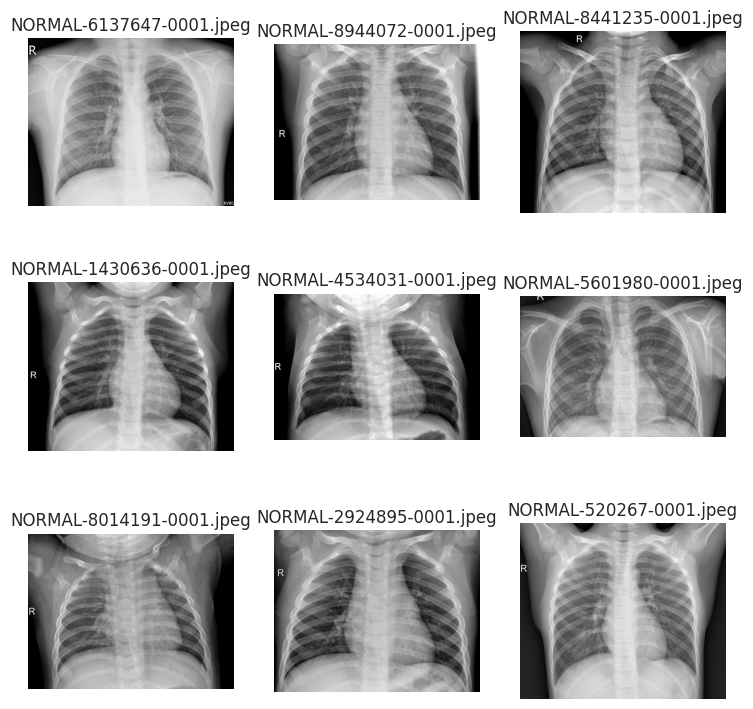

In [40]:
# prompt: normal_dir veri setindeki random 9 görüntüyü al ve bir dataframe içinde kaydet. Ayrıca bu 9 random görüntüyü dosya isimleri ile birlikte plot et.

# 9 rastgele görüntü alınır
rastgele_goruntuler = random.sample(normal_files, 9)

# Görüntü verilerini kaydetmek için bir liste oluşturulur
goruntu_verisi = []

# Görüntüler yazdırılır ve bilgileri "goruntu_verisi" içinde saklanir
fig, eksenler = plt.subplots(3, 3, figsize=(9, 9))
for i, dosya_yolu in enumerate(rastgele_goruntuler):
  goruntu = plt.imread(dosya_yolu)
  sira = i // 3
  sutun = i % 3
  eksenler[sira, sutun].imshow(goruntu, cmap='gray')
  eksenler[sira, sutun].set_title(dosya_yolu.name)
  eksenler[sira, sutun].axis('off')
  goruntu_verisi.append({'dosya_adi': dosya_yolu.name, 'dosya_yolu': str(dosya_yolu)})

plt.show()

goruntu_df = pd.DataFrame(goruntu_verisi)

**Seçilmiş bu 9 görüntünün istatistiksel özelliklerinin (maksimum, minimum, ortalama, standart sapma, genişlik, yükseklik) hesaplanması.**

In [4]:
for i, satir in goruntu_df.iterrows():
    dosya_yolu = satir['dosya_yolu']
    goruntu = plt.imread(dosya_yolu)

    yukseklik, genislik = goruntu.shape[:2]
    goruntu_dizisi = np.array(goruntu)
    maksimum = np.max(goruntu_dizisi)
    minimum = np.min(goruntu_dizisi)
    ortalama = np.mean(goruntu_dizisi)
    standart_sapma = np.std(goruntu_dizisi)

    goruntu_df.loc[i, 'genislik'] = genislik
    goruntu_df.loc[i, 'yukseklik'] = yukseklik
    goruntu_df.loc[i, 'maksimum'] = maksimum
    goruntu_df.loc[i, 'minimum'] = minimum
    goruntu_df.loc[i, 'ortalama'] = ortalama
    goruntu_df.loc[i, 'standart_sapma'] = standart_sapma

goruntu_df

,dosya_adi,dosya_yolu,genislik,yukseklik,maksimum,minimum,ortalama,standart_sapma
0,NORMAL-5402107-0001.jpeg,/root/.cache/kagglehub/datasets/tolgadincer/la...,1762.0,1060.0,255.0,0.0,120.634740,59.139660
1,NORMAL-4511610-0001.jpeg,/root/.cache/kagglehub/datasets/tolgadincer/la...,2474.0,2224.0,255.0,0.0,140.427805,77.674554
2,NORMAL-6667079-0001.jpeg,/root/.cache/kagglehub/datasets/tolgadincer/la...,936.0,712.0,255.0,0.0,115.747158,60.710324
3,NORMAL-6410283-0001.jpeg,/root/.cache/kagglehub/datasets/tolgadincer/la...,1530.0,1279.0,255.0,0.0,113.466772,63.577670
4,NORMAL-2514572-0001.jpeg,/root/.cache/kagglehub/datasets/tolgadincer/la...,2446.0,2314.0,255.0,0.0,142.777257,76.658689
5,NORMAL-6650392-0001.jpeg,/root/.cache/kagglehub/datasets/tolgadincer/la...,1762.0,1224.0,255.0,0.0,110.234783,67.991112
6,NORMAL-3985743-0001.jpeg,/root/.cache/kagglehub/datasets/tolgadincer/la...,1910.0,1303.0,255.0,0.0,127.796603,57.005919
7,NORMAL-1763721-0001.jpeg,/root/.cache/kagglehub/datasets/tolgadincer/la...,1816.0,1157.0,255.0,0.0,118.406811,65.505883
8,NORMAL-9896495-0001.jpeg,/root/.cache/kagglehub/datasets/tolgadincer/la...,1620.0,1110.0,255.0,0.0,122.489522,61.257173


# 3. Görüntü İşleme ve İyileştirme (Pre-Processing)

##3.1. Görüntüleri Kırpma

**Görüntünün sadece akciğer bölgesine odaklanılabilmesi için kırpılması. Dinamik bir bölge seçimi yapabilmek için dinamik bir eşik değeri belirlenmeye çalışılmıştır. Dinamik eşik uygulandıktan sonra görüntülerde kontürlerin bulunması gelmektedir. En büyük kontür değerinin akciğer bölgesini vereceği varsayımı ile bounding box oluşturulmuştur. Ve görüntüler bu bounding box'lara göre kırpılmıştır.**

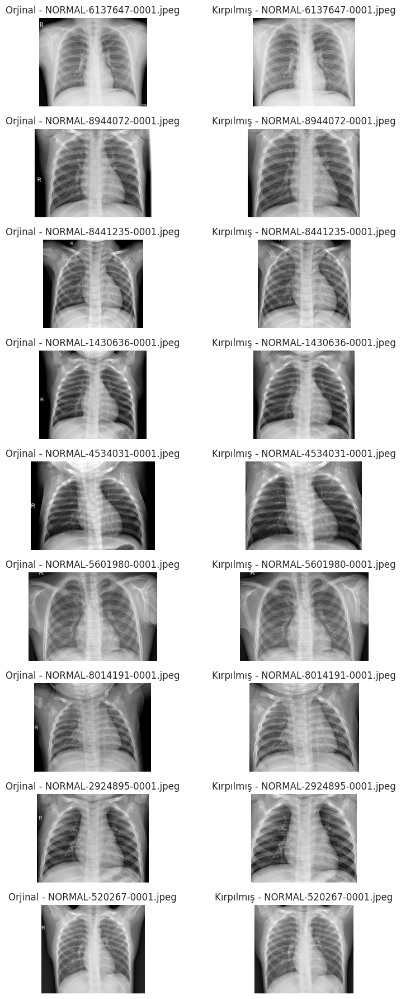

In [41]:
# prompt: Bu örnek 9 Görüntünün sadece akciğer bölgesine odaklanılabilmesi için kırpılması.
kayit_klasoru = "/content/Sayisal_Goruntu_Isleme/01_Kirpilmis"
os.makedirs(kayit_klasoru, exist_ok=True)

silinecek_goruntuler = os.listdir(kayit_klasoru)

# Kayıt edilecek klasör önce temizlenir
for dosya in silinecek_goruntuler:
    if dosya.endswith(('.jpeg')):
        goruntu_yolu = os.path.join(kayit_klasoru, dosya)
        os.remove(goruntu_yolu)
        #print(f"Silinen dosya: {goruntu_yolu}")

def akciger_bolgesi_kirp(giris_goruntu):
    # Giriş görüntüsünü gerektiğinde griye çevirme
    if giris_goruntu.ndim == 3:
        giris_goruntu = cv2.cvtColor(giris_goruntu, cv2.COLOR_BGR2GRAY)

    # Adaptif eşik değeri uygulanarak görüntü binary forma dönüştürülür
    esik_goruntu = cv2.adaptiveThreshold(giris_goruntu, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)

    # Konturlar bulunur
    kontur, _ = cv2.findContours(esik_goruntu, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    kontur = sorted(kontur, key=cv2.contourArea, reverse=True)[:2]

    # En büyük kontur bulunur
    if kontur:
        en_buyuk_kontur = max(kontur, key=cv2.contourArea)
        x, y, w, h = cv2.boundingRect(en_buyuk_kontur)
        kirpilmis_goruntu = giris_goruntu[y:y+h, x:x+w]
    else:
        kirpilmis_goruntu = giris_goruntu

    if kirpilmis_goruntu.shape[:2] == giris_goruntu.shape[:2]:
        kirpma_islemi = 0
    else:
        kirpma_islemi = 1

    return kirpilmis_goruntu, kirpma_islemi

def goruntuleri_isle_ve_goster(goruntu_df):
    kirpilmis_goruntuler = []
    fig, eksenler = plt.subplots(len(goruntu_df), 2, figsize=(9, 2 * len(goruntu_df)))

    for i, row in goruntu_df.iterrows():
        dosya_yolu = row['dosya_yolu']
        goruntu = plt.imread(dosya_yolu)

        if goruntu.shape[-1] == 4:
            goruntu = goruntu[..., :3]

        kirpik_goruntu, kirpma_islemi = akciger_bolgesi_kirp(goruntu) # Get both return values
        if kirpma_islemi == 1:
            kirpilmis_goruntuler.append(kirpik_goruntu) #Append only the image
        else:
            soldan=125
            sagdan=125
            ustten=65
            alttan=65
            goruntu_yuksekligi, goruntu_genisligi = goruntu.shape[:2] # Use goruntu for shape
            kirpik_goruntu = goruntu[ustten:goruntu_yuksekligi-alttan, soldan:goruntu_genisligi-sagdan]
            kirpilmis_goruntuler.append(kirpik_goruntu) #Append only the image


        eksenler[i, 0].imshow(goruntu, cmap='gray')
        eksenler[i, 0].set_title(f"Orjinal - {row['dosya_adi']}")
        eksenler[i, 0].axis('off')

        eksenler[i, 1].imshow(kirpik_goruntu, cmap='gray') # kirpik_goruntu is now an image
        eksenler[i, 1].set_title(f"Kırpılmış - {row['dosya_adi']}")
        eksenler[i, 1].axis('off')
        cv2.imwrite(os.path.join(kayit_klasoru, f"{goruntu_df['dosya_adi'][i]}"), kirpik_goruntu)

    plt.tight_layout()
    plt.show()

goruntuleri_isle_ve_goster(goruntu_df)

##3.2. Görüntü Yumuşatma

**Yukarıdaki KIRPILMIŞ 9 görüntüye 3x3, 15x15, 25x25 kernel filtreleri kullanılarak sırasıyla smoothing yapılması.**

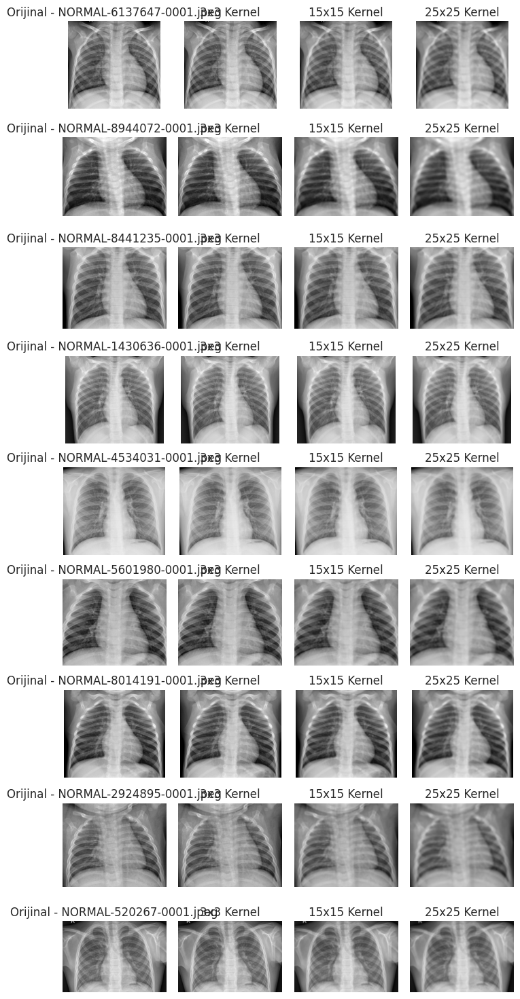

In [45]:
# prompt: Yukarıdaki KIRPILMIŞ 9 görüntüye 3*3, 15*15, 25*25 kerneller ile sırasıyla smoothing yap. Her bir kırpılmış görüntü için yaptığın smoothing sonuçlarını yan yana yaz. Kırpılmış görüntüyü satırın başına koy.
okunacak_klasor = "/content/Sayisal_Goruntu_Isleme/01_Kirpilmis"
okunan_goruntuler = [f for f in os.listdir(okunacak_klasor) if f.endswith(('.jpg', '.png', '.jpeg'))]

kayit_klasoru = "/content/Sayisal_Goruntu_Isleme/02_Yumusatilmis"
os.makedirs(kayit_klasoru, exist_ok=True)

# Kernel boyutları
kernel_boyutlari = [(3, 3), (15, 15), (25, 25)]

# Kırpılmış görüntüler üzerinde smoothing işlemi
fig, eksenler = plt.subplots(9, 4, figsize=(7, 15))

silinecek_goruntuler = os.listdir(kayit_klasoru)

# Kayıt edilecek klasör önce temizlenir
for dosya in silinecek_goruntuler:
    if dosya.endswith(('.jpeg')):
        goruntu_yolu = os.path.join(kayit_klasoru, dosya)
        os.remove(goruntu_yolu)
        #print(f"Silinen dosya: {goruntu_yolu}")

yumusatilmis_goruntuler = []

for i, dosya_adi in enumerate(okunan_goruntuler):
    goruntu_yolu = os.path.join(okunacak_klasor, dosya_adi) #Fixed: Changed 'klasor_yolu' to 'okunacak_klasor'
    goruntu = cv2.imread(goruntu_yolu)

    eksenler[i, 0].imshow(goruntu, cmap='gray')
    eksenler[i, 0].set_title(f"Orijinal - {goruntu_df['dosya_adi'][i]}")
    eksenler[i, 0].axis('off')

    for j, kernel_size in enumerate(kernel_boyutlari):

        yumusatilmis_goruntu = cv2.blur(goruntu, kernel_size)

        eksenler[i, j + 1].imshow(yumusatilmis_goruntu, cmap='gray')
        eksenler[i, j+1].set_title(f"{kernel_size[0]}x{kernel_size[1]} Kernel")
        eksenler[i, j+1].axis('off')

        if kernel_size[0] == 3:
            cv2.imwrite(os.path.join(kayit_klasoru, f"{goruntu_df['dosya_adi'][i]}"), yumusatilmis_goruntu)
            yumusatilmis_goruntuler.append(f"{goruntu_df['dosya_adi'][i]}")

yumusatilmis_goruntuler_df = pd.DataFrame(yumusatilmis_goruntuler)

plt.tight_layout()
plt.show()

**Yukarıdaki görüntülerde, kullanılan kernel (çekirdek) filtresinin boyutu arttıkça, beklenen şekilde elde edilen yumuşatma etkisinin de arttığı görülmektedir. Kernel filtresi matrisin boyutu, filtreleme sırasında hesaba katılacak komşu piksellerin sayısını belirlemektedir. Bu da kernel boyutu büyüdükçe, daha fazla sayıda pikselin ortalaması alındığı için, görüntü üzerindeki yumuşatma (bulanıklık) etkisinin belirginleşmesine neden olmaktadır. Ancak yukarıdaki görüntülerde de görülebileceği üzere kernel boyutunun artması, görüntünün detaylarının kaybolmasına neden olmaktadır. Özellikle kenarlar, köşeler gibi yüksek frekanslı görüntü bileşenleri yumuşatma işlemiyle silikleşmektedir (bulanıklaşmaktadır).**

**Bir sonraki adıma 3x3 kernel olan görüntüler taşınmıştır.**

##3.3. Gürültü Azaltma

/usr/local/lib/python3.11/dist-packages/skimage/_shared/utils.py:445: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel, or set channel_axis.
  return func(*args, **kwargs)


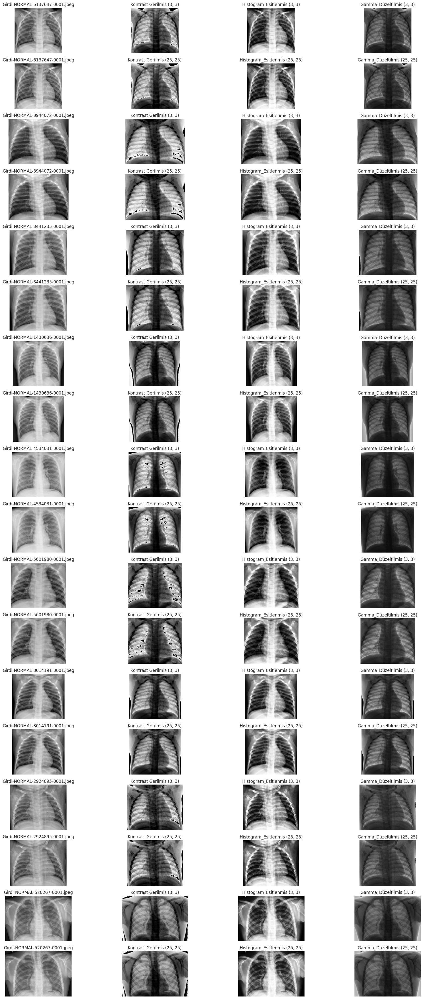

In [49]:
# prompt: Yukarıda yumuşatılmış "3x3 kernel" ve "25x25 kernel" isimli her görüntü için "Contrast Stretching", "Histogram Equalization" ve  "Gamma Correction"  uygula. 4 kolonluk ve 36 satırlık bir çıktı oluştur. Satırların her biri yukarıda smoothing yapılmış görüntü için örneğin "3x3 kernel" HER BİR görüntü için yanındaki kolona bu görüntünün "Contrast Stretching"  uygulanmış hali ve sonra yanındaki kolona "Histogram Equalization"  ve sonra yanındaki kolona "Gamma Correction" uygulanmış halini koy. Sonra ayrı bir satırda aynı görüntünün 25*25 kernel uygulanmış hali için yanındaki kolona bu görüntünün "Contrast Stretching"  uygulanmış hali ve sonra yanındaki kolona "Histogram Equalization"  ve sonra yanındaki kolona "Gamma Correction" uygulanmış halini koy. Böylece 4 kolonluk ve 18 satırlık bir subplot oluştur..

okunacak_klasor = "/content/Sayisal_Goruntu_Isleme/02_Yumusatilmis"
okunan_goruntuler = [f for f in os.listdir(okunacak_klasor) if f.endswith(('.jpg', '.png', '.jpeg'))]

kayit_klasoru = "/content/Sayisal_Goruntu_Isleme/03_Gurultu_Azaltilmis"
os.makedirs(kayit_klasoru, exist_ok=True)

silinecek_goruntuler = os.listdir(kayit_klasoru)

# Kayıt edilecek klasör önce temizlenir
for dosya in silinecek_goruntuler:
    if dosya.endswith(('.jpeg')):
        goruntu_yolu = os.path.join(kayit_klasoru, dosya)
        os.remove(goruntu_yolu)
        #print(f"Silinen dosya: {goruntu_yolu}")

def kontrast_germe(girdi):
    p2, p98 = np.percentile(girdi, (2, 98))
    gerilmis = exposure.rescale_intensity(girdi, in_range=(p2, p98))
    gerilmis = (gerilmis * 255).astype(np.uint8)
    return gerilmis

def histogram_esitleme(girdi):
    esitlenmis = exposure.equalize_hist(girdi)
    esitlenmis = (esitlenmis * 255).astype(np.uint8)
    return esitlenmis

def gamma_duzeltme(girdi, gamma=0.5): # Adjust gamma as needed
    duzeltilmis = exposure.adjust_gamma(girdi, gamma=gamma)
    duzeltilmis = (duzeltilmis * 255).astype(np.uint8)
    return duzeltilmis

kernel_boyutlari = [(3, 3), (25, 25)]

fig, eksenler = plt.subplots(len(yumusatilmis_goruntuler_df) * len(kernel_boyutlari), 4, figsize=(20, 40))

gurultu_azaltilmis_goruntuler = []
satir = 0

gurultu_azaltilmis_goruntuler_df = pd.DataFrame()

for i, sira in yumusatilmis_goruntuler_df.iterrows():
    for j, kernel_boyutu in enumerate(kernel_boyutlari):
        dosya_adi = sira[0].split('_')[-1]
        dosya_yolu = os.path.join(okunacak_klasor, f"{dosya_adi}")

        if os.path.exists(dosya_yolu):
            yumusatilmis_goruntu = plt.imread(dosya_yolu)

            kontrast_gerilmis = kontrast_germe(yumusatilmis_goruntu)
            #cv2.imwrite(os.path.join(kayit_klasoru, f"{dosya_adi}"), kontrast_gerilmis)
            gurultu_azaltilmis_goruntuler.append(f"Kontrast_Gerilmis {kernel_boyutu}-{dosya_adi}")

            histogram_esitlenmis = histogram_esitleme(yumusatilmis_goruntu)
            cv2.imwrite(os.path.join(kayit_klasoru, f"{dosya_adi}"), histogram_esitlenmis)
            gurultu_azaltilmis_goruntuler.append(f"Histogram_Esitlenmis {kernel_boyutu}-{dosya_adi}")

            gamma_duzeltilmis = gamma_duzeltme(yumusatilmis_goruntu)
            #cv2.imwrite(os.path.join(kayit_klasoru, f"{dosya_adi}"), gamma_duzeltilmis)
            gurultu_azaltilmis_goruntuler.append(f"Gamma_Düzeltilmis {kernel_boyutu}-{dosya_adi}")

            eksenler[satir, 0].imshow(yumusatilmis_goruntu, cmap='gray')
            eksenler[satir, 0].set_title(f"Girdi-{dosya_adi}")
            eksenler[satir, 0].axis('off')

            eksenler[satir, 1].imshow(kontrast_gerilmis, cmap='gray')
            eksenler[satir, 1].set_title(f"Kontrast Gerilmis {kernel_boyutu}")
            eksenler[satir, 1].axis('off')

            eksenler[satir, 2].imshow(histogram_esitlenmis, cmap='gray')
            eksenler[satir, 2].set_title(f"Histogram_Esitlenmis {kernel_boyutu}")
            eksenler[satir, 2].axis('off')

            eksenler[satir, 3].imshow(gamma_duzeltilmis, cmap='gray')
            eksenler[satir, 3].set_title(f"Gamma_Düzeltilmis {kernel_boyutu}")
            eksenler[satir, 3].axis('off')

        else:
            print(f"{dosya_yolu} bulunamadı.")

        satir += 1

gurultu_azaltilmis_goruntuler_df = pd.DataFrame(gurultu_azaltilmis_goruntuler)

plt.tight_layout()
plt.show()

**Yukarıdaki görüntüler yorumlanmadan önce bazı bilgilerin hatırlanması önemlidir.**

***Düşük Kontrast Nedir?***
Düşük kontrastlı bir görüntüde, karanlık ve aydınlık bölgeler arasındaki fark belirsizdir. Görüntü genellikle gri tonlara yakın görünür. Örneğin, siyah ve beyaz arasındaki geçişler net değildir; bunun yerine gri tonlar hakimdir.

Yukarıdaki yumuşatılmış görüntülerin bazılarında bu durum net bir şekilde görülmektedir.

Yine düşük konstratlı görüntülerde, görüntüdeki detaylar (örneğin, nesnelerin kenarları, dokular veya desenler) net olmamaktadır. Detaylar birbirine karışmış gibi görünmekte ve ayırt edilmesi zorlaşmaktadır.

Düşük kontrastlı görüntüler daha donuk ve soluk görülürler.


**"Contrast Stretching" ("Kontrast Germe")ve "Histogram Equalization" ("Histogram Eşitleme") uygulamamızın ana nedenlerinden biri düşük kontrastın giderilmesidir.**


**"Kontrast Germe" Nedir?**
"Kontrast Germe", histogramda belirli bir bölgeye yoğunlaşmış piksel değerlerinin daha geniş bir aralığa gerilmesi (yayılması) olarak özetlenebilir. Bu germe işlemi görüntüde kontrastı artırarak daha net bir görüntü elde edilmesini sağlamaktadır. Yukarıdaki görüntülerdeki karanlık ve aydınlık bölgeler arasındaki farkın belirginleştiği gözlenmektedir. Yine düşük kontrastlı bölgelerdeki detaylar daha görünür hale gelir.

"Kontrast Germe", genellikle görüntünün doğal görünümünü korur, çünkü parlaklık değerleri doğrusal olarak ölçeklenmektedir.


**Yukarıdaki örneklerde **de görülebileceği üzere karanlık ve bulanık görüntülerde, Kontrast Germe" uygulandığında karanlık bölgeler daha koyu, aydınlık bölgeler daha parlak hale gelir ve detaylar belirginleşmektedir.

**"Histogram Eşitleme" Nedir?**
"Histogram Eşitleme", görüntünün parlaklık dağılımını (histogramını) eşitleyerek kontrastı artırır. Bu yöntem, özellikle görüntünün parlaklık değerlerinin belirli bir aralıkta yoğunlaştığı durumlarda etkili olmaktadır.

Görüntünün histogramı hesaplanır. Sonra histogram, kümülatif dağılım fonksiyonu (CDF) kullanılarak eşitlenir ve bu işlem, parlaklık değerlerinin daha eşit bir şekilde dağılmasını sağlar.

"Histogram Eşitleme" uygulamalarında bazı durumlar için, görüntüde aşırı kontrast artışı ve yapay bir görünüm oluşması söz konusu olabilmektedir.

Özellikle düşük kontrastlı bölgelerdeki detaylar daha görünür hale gelir.
"Histogram Eşitleme", görüntünün doğal görünümünü bozabilir, çünkü parlaklık değerleri doğrusal olmayan bir şekilde değiştirilmektedir.

Ayrıca görüntüde gürültü olması durumunda, bu gürültünün artması da söz konusu olabilmektedir.

**İki yöntem arasında genel olarak** "Kontrast Germe" görüntünün doğal görünümünü korunmak istenen durumlarda ve kontrast artışına ihtiyaç duyulduğunda daha uygunken, "Histogram Eşitleme" görüntüdeki detaylar maksimum düzeyde ortaya çıkarılmak istendiğinde ve doğal görünümden ödün verilebilecek durumlarda daha etkili olmaktadır.

**Yukarıdaki örneklerde **bu iki yöntem farklı görüntüler için farklı sonuçlar vermektedir. Gözle kontrol edildiğinde bazı görüntüler için ilk yöntem bazı görüntülerde ikinci yöntem daha güzel sonuçlar vermektedir.


"Kontrast Germe" için kontrast artışı genelde orta düzeyde iken "Histogram Equalization" yönteminde yüksek düzeyde oluşmaktadır. İlk yöntemde doğal görünüm daha fazla korunurken ikinci yöntemde bozulmalar oluşabilmektedir. İlk yöntemde detayların belirginliği	sınırlı seviyede kalırken, ikinci yöntemde daha fazla görülmektedir.
İlk öntemin görüntüdeki gürültüye etkisi	sınırlı olurken ikinci yöntemde artabilmektedir.

Örneğin "NORMAL-9896495.png" veya "NORMAL-1763721.png" kernel ile yumuşatılmış görüntü için bakıldığında histogram eşitleme yönteminde detaylar kontrast germe yöntemine göre daha belirgindir. Eldeki örnekler değerlendirildiğinde görüntü doğallık seviyelerinde büyük farklar dikkate çekmemektedir.

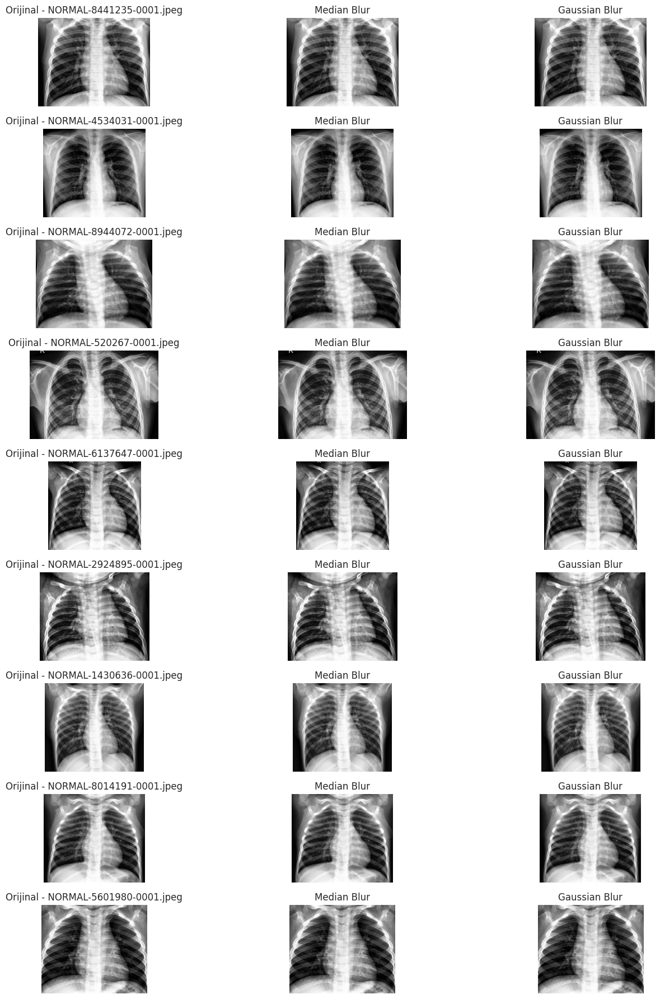

In [57]:
okunacak_klasor = "/content/Sayisal_Goruntu_Isleme/03_Gurultu_Azaltilmis"
okunan_goruntuler = [f for f in os.listdir(okunacak_klasor) if os.path.isfile(os.path.join(okunacak_klasor, f))]

kayit_klasoru = "/content/Sayisal_Goruntu_Isleme/04_Blur_Uygulanmis"
os.makedirs(kayit_klasoru, exist_ok=True)
blur_uygulanmis_goruntuler = []

silinecek_goruntuler = os.listdir(kayit_klasoru)

# Kayıt edilecek klasör önce temizlenir
for dosya in silinecek_goruntuler:
    if dosya.endswith(('.jpeg')):
        goruntu_yolu = os.path.join(kayit_klasoru, dosya)
        os.remove(goruntu_yolu)
        #print(f"Silinen dosya: {goruntu_yolu}")

# Alt grafikler için gereken satır sayısı bulunur
satir_sayisi = len(okunan_goruntuler)

# Alt grafikler oluşturulur
fig, eksenler = plt.subplots(satir_sayisi, 3, figsize=(15, 2 * satir_sayisi))

blur_uygulanmis_goruntuler_df = pd.DataFrame()

for i, dosya_adi in enumerate(okunan_goruntuler):
    goruntu_yolu = os.path.join(okunacak_klasor, dosya_adi)
    goruntu = cv2.imread(goruntu_yolu)

    # Orjinal görüntüyü göster
    eksenler[i, 0].imshow(goruntu , cmap='gray')
    eksenler[i, 0].set_title(f"Orijinal - {dosya_adi}")
    eksenler[i, 0].axis('off')

    # Median Blur
    median_blurred = cv2.medianBlur(goruntu, 5)
    #cv2.imwrite(os.path.join(kayit_klasoru, f"{dosya_adi}"), median_blurred)
    eksenler[i, 1].imshow(median_blurred , cmap='gray')
    eksenler[i, 1].set_title(f"Median Blur")
    eksenler[i,1].axis('off')
    blur_uygulanmis_goruntuler.append(f"{dosya_adi}")

    # Gaussian Blur
    gaussian_blurred = cv2.GaussianBlur(goruntu, (5, 5), 0)
    cv2.imwrite(os.path.join(kayit_klasoru, f"{dosya_adi}"), gaussian_blurred)
    eksenler[i, 2].imshow(gaussian_blurred , cmap='gray')
    eksenler[i, 2].set_title(f"Gaussian Blur")
    eksenler[i, 2].axis('off')
    blur_uygulanmis_goruntuler.append(f"Gaussian_Blur_{dosya_adi}")

blur_uygulanmis_goruntuler_df = pd.DataFrame(blur_uygulanmis_goruntuler)

plt.tight_layout()
plt.show()

Bu resimler arasındaki farkları analiz edebilmek için öncelikle "Median Blur" ve "Gaussian Blur" yöntemlerinin tanımları incelenecek olursa...

**"Median Blur" (Ortanca Bulanıklaştırma) nedir?**
Median Blur, görüntüdeki gürültüyü azaltmak için belirli bir pencere (kernel) içindeki piksellerin ortanca değerini alarak çalışır. Özellikle tuz-biber gürültüsü gibi ani piksel bozulmalarını etkili şekilde temizlerken, kenarları koruma özelliğiyle dikkat çekmektedir. Ancak özellikle büyük kernel boyutlarında görüntüdeki detayları veya dokuları biraz bozabilmektedir.

**"Gaussian Blur" (Gauss Bulanıklaştırma) nedir?**
Gaussian Blur, görüntüyü yumuşatmak için Gaussian dağılımına dayalı bir ağırlıklı ortalama alır. Bu yöntem, görüntüdeki yüksek frekanslı gürültüyü azaltırken, kenarları ve detayları homojen bir şekilde bulanıklaştırır. Ancak kenarları bulanıklaştırken detay kaybına neden olabilmektedir.

Görüntüye uygulanan Median Blur ve Gaussian Blur tekniklerinin sonuçları, bu iki filtreleme yönteminin farklı amaçlara hizmet ettiğini göstermektedir.
Median Blur, özellikle görüntülerdeki kenar keskinliklerini genel olarak korumuştur. (örneğin, [NORMAL-2514572.png] sınırları net kalmıştır).

Gaussian Blur ise görüntüdeki yüksek frekanslı gürültüyü genel olarak azaltmış, ancak kenarları bulanıklaştırarak detay kaybına yol açmıştır.

##3.4. Eşik Sayısı Belirleme

In [9]:
# prompt: "/content/Sayisal_Goruntu_Isleme/BlurUygulanmis" klasöründe bulunan görüntülerin her biri için: "Manuel Eşikleme", "Otsu's Thresholding", Adaptif Eşikleme", "Histogram Analizi", "K-Means Kümeleme" yöntemleri ile ayrı ayrı optimum EŞİK SAYISI belirle.

okunacak_klasor = "/content/Sayisal_Goruntu_Isleme/04_Blur_Uygulanmis"
okunan_goruntuler = [f for f in os.listdir(okunacak_klasor) if os.path.isfile(os.path.join(okunacak_klasor, f))]

for i, dosya_adi in enumerate(okunan_goruntuler):
    goruntu_yolu = os.path.join(okunacak_klasor, dosya_adi)
    goruntu = cv2.imread(goruntu_yolu, cv2.IMREAD_GRAYSCALE)

    print("------------------------------------")
    print(f"GORUNTU : = {dosya_adi}")

    # 1. Manual Thresholding (Example value, needs adjustment)
    manual_thresh = 127  # Adjust this value
    _, manual_thresholded = cv2.threshold(goruntu, manual_thresh, 255, cv2.THRESH_BINARY)
    print(f"Manual Thresholding: Optimal threshold = {manual_thresh}")

    # 2. Otsu's Thresholding
    otsu_thresh = threshold_otsu(goruntu)
    _, otsu_thresholded = cv2.threshold(goruntu, otsu_thresh, 255, cv2.THRESH_BINARY)
    print(f"Otsu's Thresholding: Optimal threshold = {otsu_thresh}")

    # 3. Adaptive Thresholding
    adaptive_thresh = threshold_local(goruntu, block_size=15, offset=10)  # Adjust block_size and offset
    adaptive_thresholded = goruntu > adaptive_thresh
    print(f"Adaptive Thresholding: Using block size = 15, offset = 10")

    # 4. Histogram Analysis (finding peaks - simplified approach)
    hist, _ = np.histogram(goruntu.flatten(), 256, [0, 256])
    peaks = np.where(np.diff(hist) > 0)[0]
    histogram_threshold = peaks[0] if peaks.size > 0 else 127
    print(f"Histogram Analysis: Optimal threshold (based on peak) = {histogram_threshold}")

    # 5. K-Means Clustering
    X = goruntu.reshape(-1, 1)
    kmeans = KMeans(n_clusters=2, random_state=0).fit(X)
    kmeans_thresholded = kmeans.labels_.reshape(goruntu.shape) * 255
    kmeans_threshold = kmeans.cluster_centers_[0][0] if kmeans.cluster_centers_[0][0] < kmeans.cluster_centers_[1][0] else kmeans.cluster_centers_[1][0]
    print(f"K-means Clustering: Optimal threshold = {kmeans_threshold}")
    print("------------------------------------")


------------------------------------
GORUNTU : = NORMAL-3985743-0001.jpeg
Manual Thresholding: Optimal threshold = 127
Otsu's Thresholding: Optimal threshold = 127
Adaptive Thresholding: Using block size = 15, offset = 10
Histogram Analysis: Optimal threshold (based on peak) = 1
K-means Clustering: Optimal threshold = 64.21463537865624
------------------------------------
------------------------------------
GORUNTU : = NORMAL-4511610-0001.jpeg
Manual Thresholding: Optimal threshold = 127
Otsu's Thresholding: Optimal threshold = 127
Adaptive Thresholding: Using block size = 15, offset = 10
Histogram Analysis: Optimal threshold (based on peak) = 0
K-means Clustering: Optimal threshold = 64.35145970084406
------------------------------------
------------------------------------
GORUNTU : = NORMAL-5402107-0001.jpeg
Manual Thresholding: Optimal threshold = 127
Otsu's Thresholding: Optimal threshold = 127
Adaptive Thresholding: Using block size = 15, offset = 10
Histogram Analysis: Optimal 

1. Manuel Eşikleme
Optimal threshold = 127
Bu yöntemde, eşik değeri manuel olarak belirlenir. Görüntü, belirlenen bu eşik değerine göre ikili (binary) hale getirilir. Bu yöntem, hızlı ve kontrol edilebilir olması nedeniyle tercih edilebilmektedir.

2. Otsu Eşikleme
Optimal threshold = 127
Otsu yöntemi, görüntünün histogramını analiz ederek en iyi eşik değerini otomatik olarak hesaplar.
Bu yöntem, iki zıt piksel grubunu (genellikle arka plan ve ön plan) maksimum iç sınıf varyansını minimize edecek şekilde ayırmaktadır.
Akciğer röntgenlerinde, bu yöntem akciğer dokularını çevre dokudan ayırmak için sıklıkla kullanılmaktadır.

3. Adaptif Eşikleme
Using block size = 15, offset = 10
Adaptif eşikleme, görüntünün farklı bölgeleri için farklı eşik değerleri kullanır. Bu, lokal ışık değişimlerine daha iyi uyum sağlamaktadır.
Blok boyutu ve offset değeri, lokal eşik değerlerinin nasıl hesaplanacağını belirler.
Özellikle düzensiz aydınlatma koşullarında veya değişken doku özelliklerine sahip tıbbi görüntülerde faydalıdır.

4. Histogram Analizi
Optimal threshold (based on peak) = 0
Bu yöntem, görüntünün histogramındaki pik değerlerini kullanarak bir eşik belirler.
Ancak bu durumda, optimal eşik değeri sıfır olarak belirlenmiş, bu da yöntemin bu özel görüntü için uygun olmadığını gösterebilir. Bu, histogramın düz bir yapıda olduğunu veya pik değerinin uygun bir eşik sağlamadığını göstermektedir.

5. K-means Clustering
Optimal threshold = 63.867798812504404
K-means kümeleme, pikselleri benzer özelliklere göre gruplar ve bu grupların ortalamalarını kullanarak eşik değeri belirler.
Bu yöntem, görüntünün birden fazla doku veya yapıyı içermesi durumunda, bu yapıları birbirinden ayırmak için kullanışlıdır.

Bu sonuçlar, aynı görüntü üzerinde farklı eşikleme yöntemlerinin nasıl farklı sonuçlar üretebileceğini göstermektedir. Her bir yöntemin avantajları ve kısıtlamaları, uygulandığı duruma ve görüntünün özelliklerine göre değişmektedir.

**Eşik sayısı belirlemeye yardımcı bazı ek kontroller aşağıdaki gibi yapılabilir**

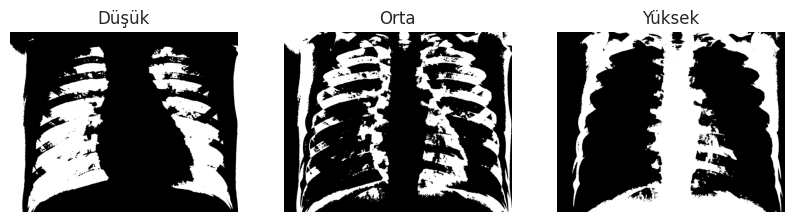

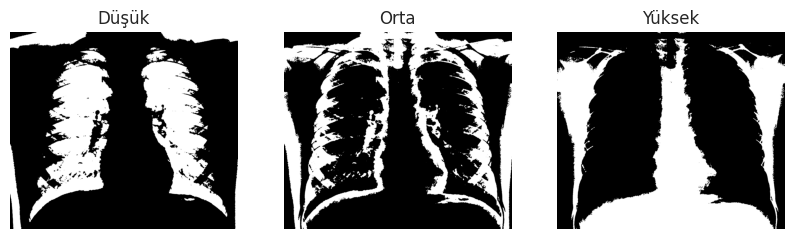

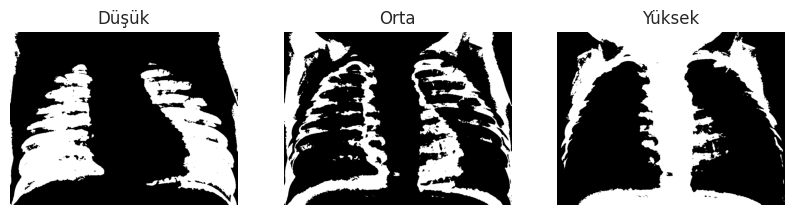

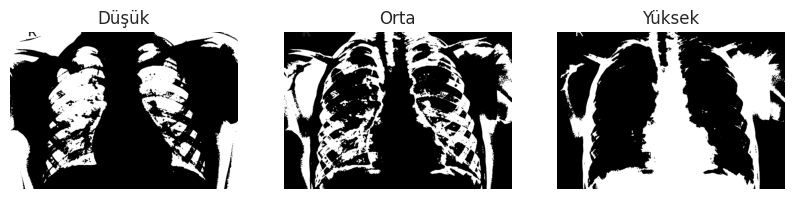

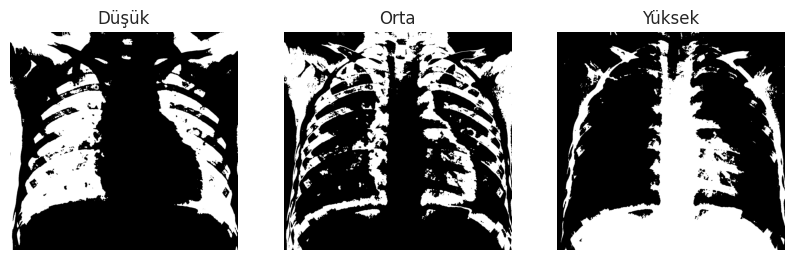

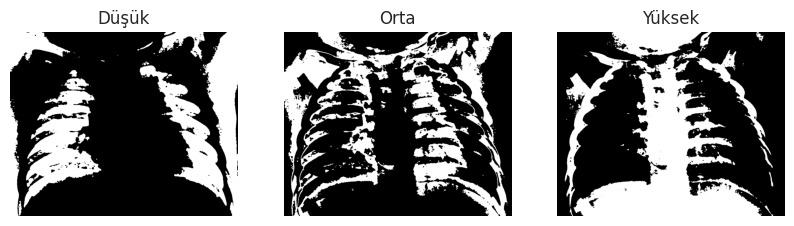

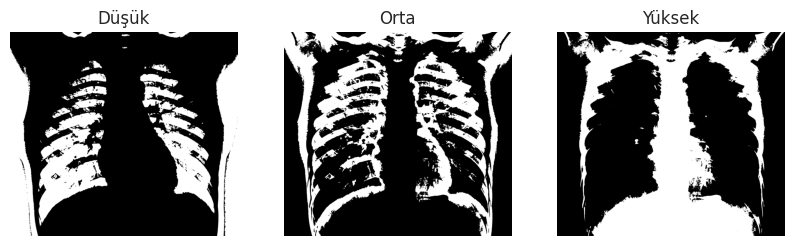

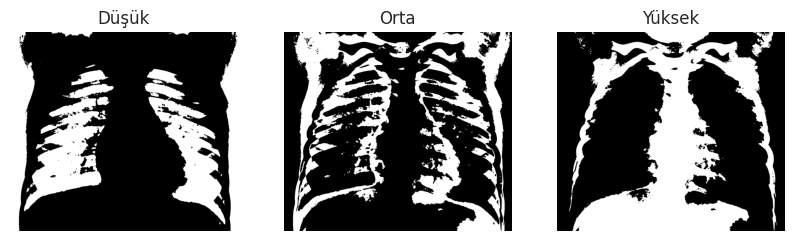

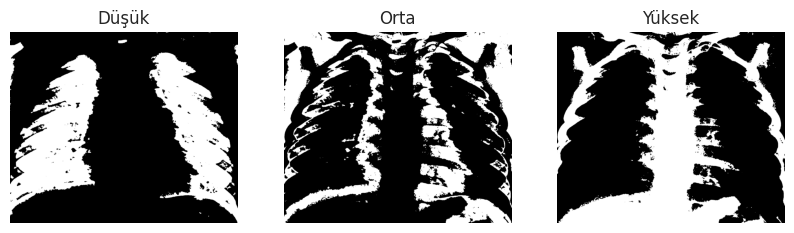

In [58]:
okunacak_klasor = "/content/Sayisal_Goruntu_Isleme/04_Blur_Uygulanmis"
okunan_goruntuler = [f for f in os.listdir(okunacak_klasor) if os.path.isfile(os.path.join(okunacak_klasor, f))]

for i, dosya_adi in enumerate(okunan_goruntuler):
    goruntu_yolu = os.path.join(okunacak_klasor, dosya_adi)
    # Load the image in grayscale
    goruntu = cv2.imread(goruntu_yolu, cv2.IMREAD_GRAYSCALE)

    # Eşik değerleri belirleme (Bu değerler, 'o1' ve 'o2' )
    esikler = {
        'dusuk' : (0,80),
        'orta' : (81, 160),
        'yuksek': (161, 255)
        }
    regions = {}
    # o1 ve o2 için maskeleme işleminin yapılması
    for label, (dusuk, yuksek) in esikler.items():
        _, dusuk_esik = cv2.threshold(goruntu, dusuk, 255, cv2.THRESH_BINARY)

        _, yuksek_esik = cv2.threshold(goruntu, yuksek, 255, cv2.THRESH_BINARY_INV)

        region = cv2.bitwise_and(dusuk_esik, yuksek_esik)

        regions[label] = region

    # o1 ve o2 bölgelerini görselleştir
    plt.figure(figsize=(10, 8))
    plt.subplot(1, 3, 1)

    plt.imshow(regions['dusuk'], cmap='gray')
    plt.title('Düşük')
    plt.axis('off')
    plt.subplot(1, 3, 2)
    plt.imshow(regions['orta'], cmap='gray')
    plt.title('Orta')
    plt.axis('off')
    plt.subplot(1, 3, 3)
    plt.imshow(regions['yuksek'], cmap='gray')
    plt.title('Yüksek')
    plt.axis('off')
    plt.show()

**Örnek bir görüntü için tüm eşikler incelenecek olursa...**

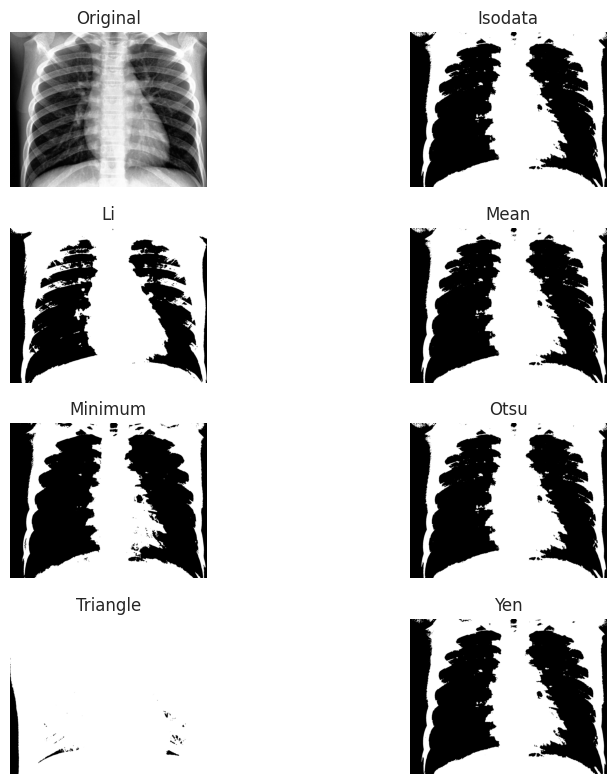

In [59]:
okunacak_klasor = "/content/Sayisal_Goruntu_Isleme/04_Blur_Uygulanmis"
okunan_goruntuler = [f for f in os.listdir(okunacak_klasor) if os.path.isfile(os.path.join(okunacak_klasor, f))]

for i, dosya_adi in enumerate(okunan_goruntuler):
    goruntu_yolu = os.path.join(okunacak_klasor, dosya_adi)
    goruntu = cv2.imread(goruntu_yolu)

    goruntu = goruntu.astype(np.uint8)

    if goruntu is not None:
        if i == 0:
            # Convert the image to grayscale before applying try_all_threshold
            gri_goruntu = cv2.cvtColor(goruntu, cv2.COLOR_BGR2GRAY)
            fig, ax = try_all_threshold(gri_goruntu, figsize=(10, 8), verbose=False) # Pass the grayscale image

plt.show()

#4. Thresholding

<ipython-input-60-13104091977c>:31: UserWarning: threshold_multiotsu is expected to work correctly only for grayscale images; image shape (1428, 1810, 3) looks like that of an RGB image.
  esikler = threshold_multiotsu(giris_goruntu, classes=3)


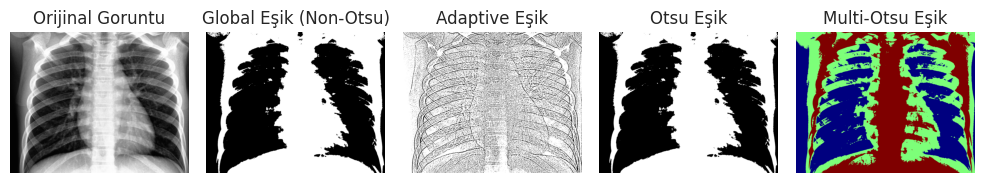

<ipython-input-60-13104091977c>:31: UserWarning: threshold_multiotsu is expected to work correctly only for grayscale images; image shape (1470, 1702, 3) looks like that of an RGB image.
  esikler = threshold_multiotsu(giris_goruntu, classes=3)


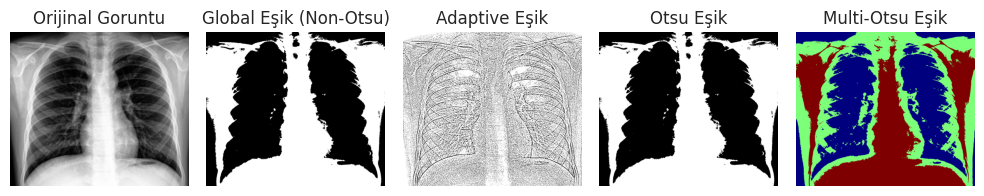

<ipython-input-60-13104091977c>:31: UserWarning: threshold_multiotsu is expected to work correctly only for grayscale images; image shape (787, 1038, 3) looks like that of an RGB image.
  esikler = threshold_multiotsu(giris_goruntu, classes=3)


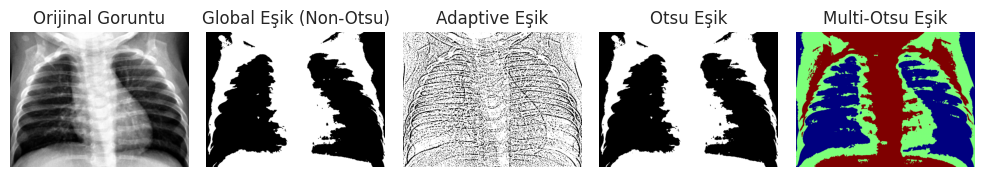

<ipython-input-60-13104091977c>:31: UserWarning: threshold_multiotsu is expected to work correctly only for grayscale images; image shape (1238, 1801, 3) looks like that of an RGB image.
  esikler = threshold_multiotsu(giris_goruntu, classes=3)


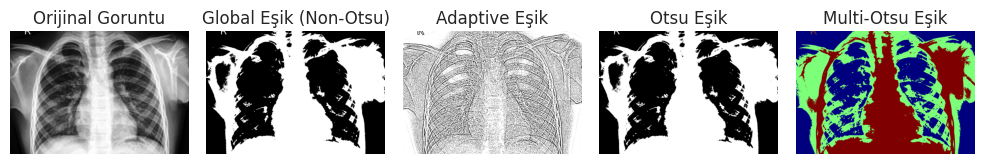

<ipython-input-60-13104091977c>:31: UserWarning: threshold_multiotsu is expected to work correctly only for grayscale images; image shape (1230, 1288, 3) looks like that of an RGB image.
  esikler = threshold_multiotsu(giris_goruntu, classes=3)


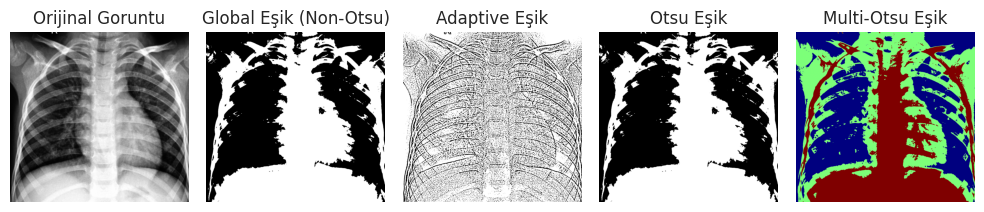

<ipython-input-60-13104091977c>:31: UserWarning: threshold_multiotsu is expected to work correctly only for grayscale images; image shape (910, 1126, 3) looks like that of an RGB image.
  esikler = threshold_multiotsu(giris_goruntu, classes=3)


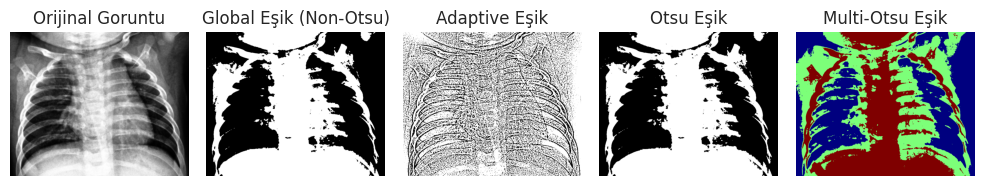

<ipython-input-60-13104091977c>:31: UserWarning: threshold_multiotsu is expected to work correctly only for grayscale images; image shape (1946, 2176, 3) looks like that of an RGB image.
  esikler = threshold_multiotsu(giris_goruntu, classes=3)


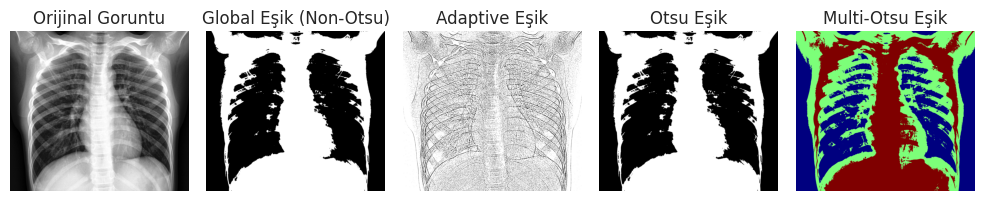

<ipython-input-60-13104091977c>:31: UserWarning: threshold_multiotsu is expected to work correctly only for grayscale images; image shape (1412, 1620, 3) looks like that of an RGB image.
  esikler = threshold_multiotsu(giris_goruntu, classes=3)


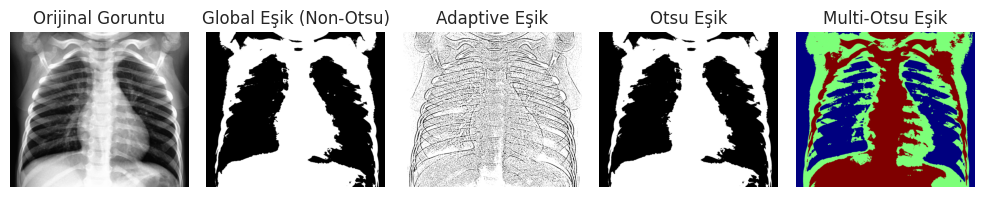

<ipython-input-60-13104091977c>:31: UserWarning: threshold_multiotsu is expected to work correctly only for grayscale images; image shape (1189, 1420, 3) looks like that of an RGB image.
  esikler = threshold_multiotsu(giris_goruntu, classes=3)


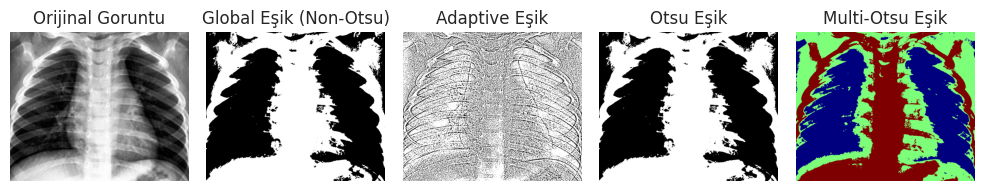

In [60]:
okunacak_klasor = "/content/Sayisal_Goruntu_Isleme/04_Blur_Uygulanmis"
okunan_goruntuler = [f for f in os.listdir(okunacak_klasor) if os.path.isfile(os.path.join(okunacak_klasor, f))]
kayit_klasoru = "/content/Sayisal_Goruntu_Isleme/05_Esikten_Gecirilmis"
os.makedirs(kayit_klasoru, exist_ok=True)

silinecek_goruntuler = os.listdir(kayit_klasoru)
# Kayıt edilecek klasör önce temizlenir
for file in silinecek_goruntuler:
    if file.endswith(('.jpeg')):
        goruntu_yolu = os.path.join(kayit_klasoru, file)
        os.remove(goruntu_yolu)

def global_threshold(giris_goruntu, esik_degeri):
    _, cikis_goruntu = cv2.threshold(giris_goruntu, esik_degeri, 255, cv2.THRESH_BINARY)
    return cikis_goruntu

def adaptive_threshold(giris_goruntu):
    if giris_goruntu is None or giris_goruntu.size == 0:
        raise ValueError("Giriş görüntüsü boş veya geçersiz. Görüntü yolunu ve dosyasını kontrol edin.")
    gri_goruntu = cv2.cvtColor(giris_goruntu, cv2.COLOR_BGR2GRAY)
    adaptive_esik = cv2.adaptiveThreshold(gri_goruntu, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    return adaptive_esik

def otsu_threshold(giris_goruntu):
    # Convert the image to grayscale before applying Otsu's thresholding
    gri_goruntu = cv2.cvtColor(giris_goruntu, cv2.COLOR_BGR2GRAY)
    _, otsu_esik = cv2.threshold(gri_goruntu, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    return otsu_esik

def multiotsu_threshold(giris_goruntu):
    esikler = threshold_multiotsu(giris_goruntu, classes=3)
    gri_goruntu = cv2.cvtColor(giris_goruntu, cv2.COLOR_BGR2GRAY)
    bolgeler = np.digitize(gri_goruntu, bins=esikler)
    return bolgeler

for i, dosya_adi in enumerate(okunan_goruntuler):
    goruntu_yolu = os.path.join(okunacak_klasor, dosya_adi)
    goruntu = cv2.imread(goruntu_yolu)

    if goruntu is None:
        print(f"Error: Could not load image from {goruntu_yolu}. Check the file path.")
    else:
        try:
            global_thresh = global_threshold(goruntu, 127) # Example threshold value

            adaptive_thresh = adaptive_threshold(goruntu)

            otsu_thresh = otsu_threshold(goruntu)

            multiotsu_bolgeler = multiotsu_threshold(goruntu)
            cv2.imwrite(os.path.join(kayit_klasoru, f"{dosya_adi}"), multiotsu_bolgeler)

        except ValueError as e:
            print(f"Error: {e}")


        plt.figure(figsize=(10, 5))

        plt.subplot(1, 5, 1)
        plt.imshow(goruntu, cmap="gray")
        plt.title("Orijinal Goruntu")
        plt.axis('off')

        plt.subplot(1, 5, 2)
        plt.imshow(global_thresh, cmap="gray")
        plt.title("Global Eşik (Non-Otsu)")
        plt.axis('off')

        plt.subplot(1, 5, 3)
        plt.imshow(adaptive_thresh, cmap="gray")
        plt.title("Adaptive Eşik")
        plt.axis('off')

        plt.subplot(1, 5, 4)
        plt.imshow(otsu_thresh, cmap="gray")
        plt.title("Otsu Eşik")
        plt.axis('off')

        plt.subplot(1, 5, 5)
        plt.imshow(multiotsu_bolgeler, cmap="jet")
        plt.title("Multi-Otsu Eşik")
        plt.axis('off')

        plt.tight_layout()
        plt.show()

#5. Post-Processing

##5.1.	Uygun morfolojik operatörleri, uygun structural element yapısı ve boyutunu seçerek görüntüye uygulayınız.

<ipython-input-61-f7bb0dea86d6>:43: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, eksenler = plt.subplots(1, 3, figsize=(10, 5))


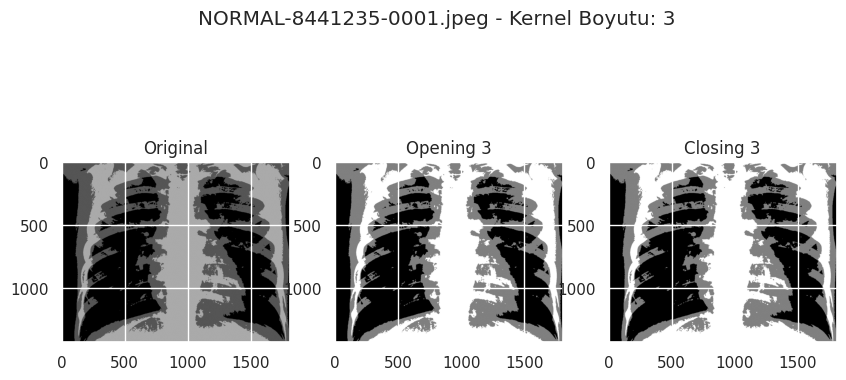

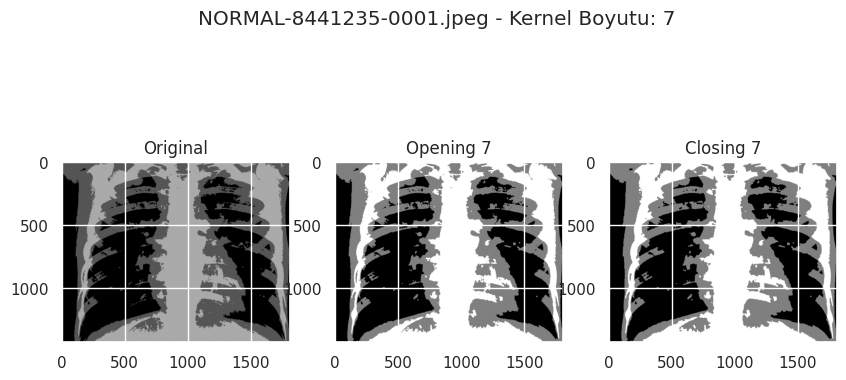

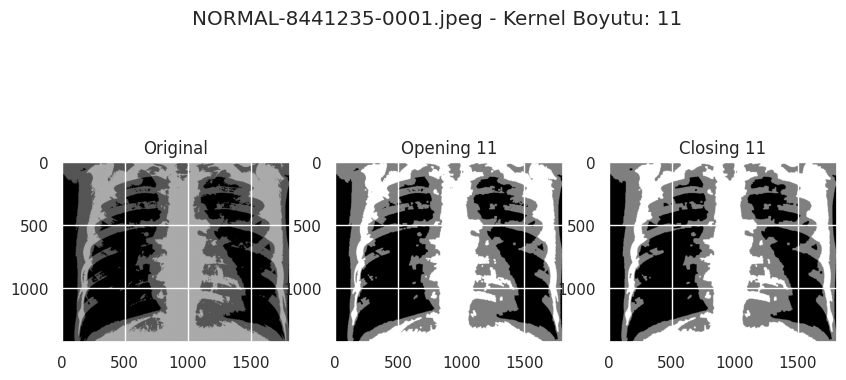

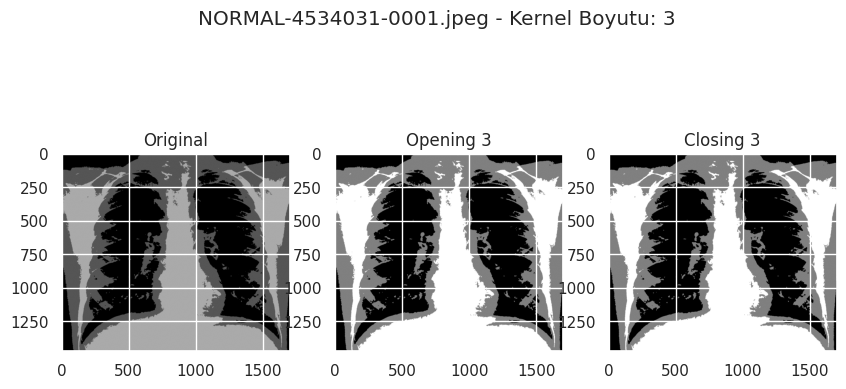

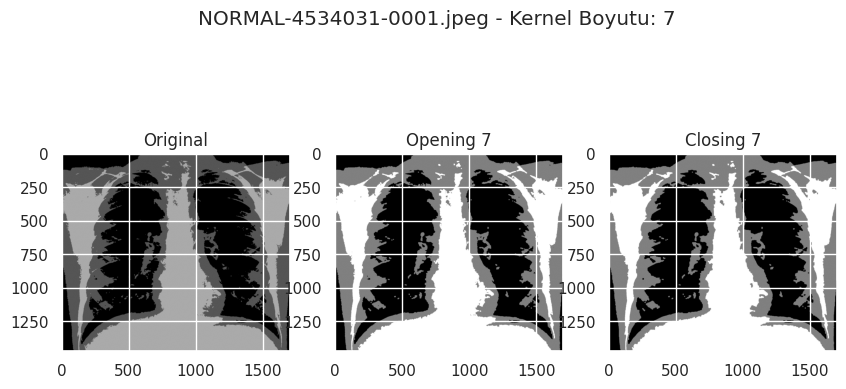

...

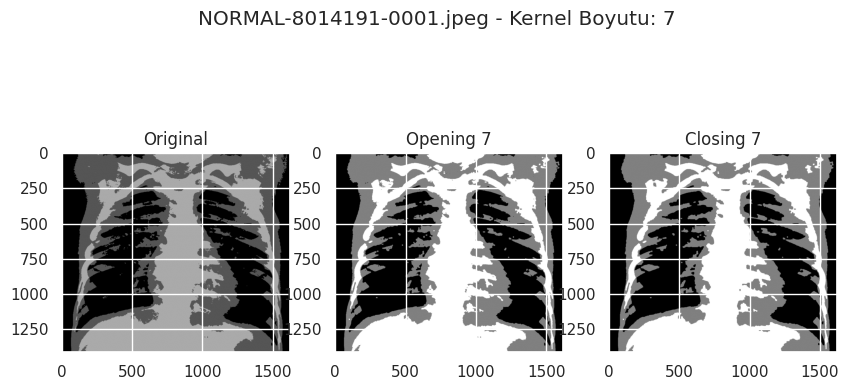

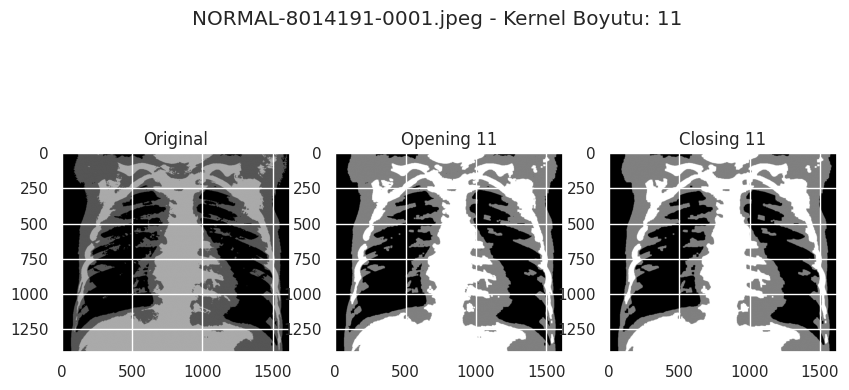

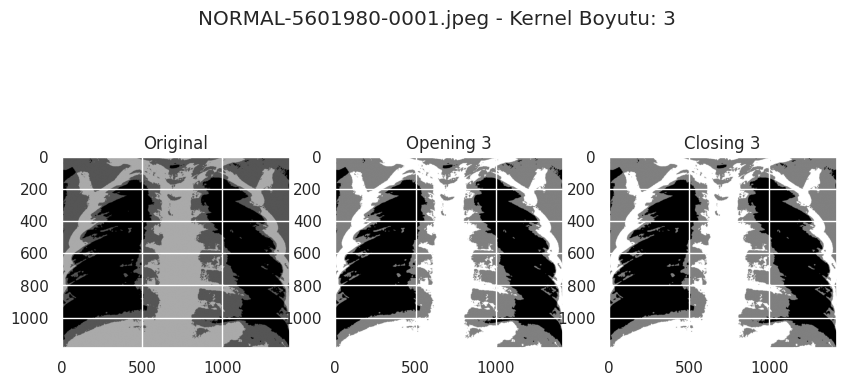

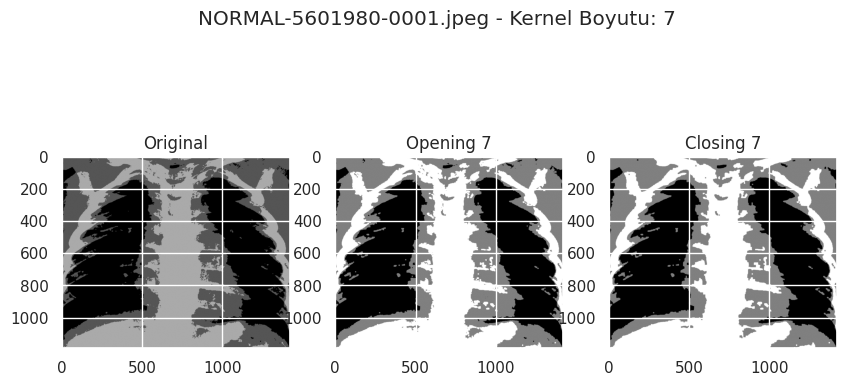

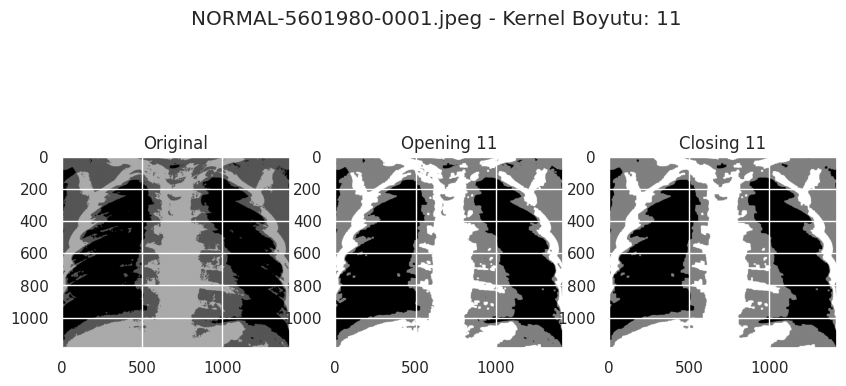

In [61]:
# prompt: "/content/Sayisal_Goruntu_Isleme/EsiktenGecirilmis" klasöründeki tüm görüntülerin HER BİRİ için;  morphology.erosion, morphology.opening, morphology.closing ve morphology.dilation morfolojik işlemlerini yap. Önce kernel = morphology.disk  3 , 7 ve 15 structure elementleri için ayrı ayrı dene. Bunları "Morfolojik_Islenmis" klasörüne yaz ve aynı zamanda plot et.

okunacak_klasor = "/content/Sayisal_Goruntu_Isleme/05_Esikten_Gecirilmis"
okunan_goruntuler = [f for f in os.listdir(okunacak_klasor) if os.path.isfile(os.path.join(okunacak_klasor, f))]
kayit_klasoru = "/content/Sayisal_Goruntu_Isleme/06_Morfolojik_Islenmis"
os.makedirs(kayit_klasoru, exist_ok=True)

silinecek_goruntuler = os.listdir(kayit_klasoru)
# Kayıt edilecek klasör önce temizlenir
for dosya in silinecek_goruntuler:
    if dosya.endswith(('.jpeg')):
        goruntu_yolu = os.path.join(kayit_klasoru, dosya)
        os.remove(goruntu_yolu)

kernel_boyutlari = [3, 7, 11]

# Okunacak_klasor dizinindeki görüntüler için dönülür
for i, dosya_adi in enumerate(okunan_goruntuler):
    goruntu_yolu = os.path.join(okunacak_klasor, dosya_adi)
    goruntu = cv2.imread(goruntu_yolu, cv2.IMREAD_GRAYSCALE)

    for kernel_boyutu in kernel_boyutlari:
    # Farklı şekillerde kernel oluşturmak mümkündür

        # Dikdörtgern (Kare)
        # Disk (Daire)
        # Çarpı Şekilli
        # Eliptik
        # Çizgi
        # Özel Oluşturulmuş Şekilli

        #kernel = morphology.disk(kernel_boyutu)
        kernel = np.ones((kernel_boyutu,kernel_boyutu), np.uint8)

        #dilation = morphology.dilation(image, kernel)
        #erosion = morphology.erosion(image, kernel)
        opening_img = morphology.opening(goruntu, kernel)
        closing_img = morphology.closing(opening_img, kernel)

        if kernel_boyutu == 7:
          cv2.imwrite(os.path.join(kayit_klasoru, f"{dosya_adi}"), closing_img)

        fig, eksenler = plt.subplots(1, 3, figsize=(10, 5))
        eksenler[0].imshow(goruntu, cmap='gray')
        eksenler[0].set_title('Original')

        #eksenler[1].imshow(dilation, cmap='gray')
        #eksenler[1].set_title('Dilation')

        eksenler[1].imshow(opening_img, cmap='gray')
        eksenler[1].set_title(f"Opening {kernel_boyutu}")

        eksenler[2].imshow(closing_img, cmap='gray')
        eksenler[2].set_title(f"Closing {kernel_boyutu}")

        #eksenler[4].imshow(erosion, cmap='gray')
        #eksenler[4].set_title('Erosion')
        plt.suptitle(f"{dosya_adi} - Kernel Boyutu: {kernel_boyutu}")
plt.show()


Bu görüntü, bir akciğer röntgeni üzerinde uygulanan morfolojik işlemleri göstermektedir. Açma (Opening) ve Kapama (Closing) işlemleri, görüntü işleme tekniklerinde özellikle gürültü temizleme ve segmentasyon işlemlerini iyileştirmek için kullanılmaktadır. Bu işlemler, matematiksel morfoloji alanında yaygın olarak kullanılan temel yöntemlerdir. Görüntüleri tek tek analiz edersek;

1. Orijinal Görüntü
Orijinal görüntü, multi-Otsu eşikleme yöntemi ile işlenmiştir.
Akciğer yapıları, çevresindeki dokulara kıyasla farklı tonlarda gösterilmiştir.
Görüntü içinde bazı düzensizlikler, küçük nesneler ve pürüzlü alanlar bulunmaktadır. Bu tür segmentasyon sonrası gürültüleri gidermek için morfolojik işlemler devreye girmektedir.

2. Opening (Açma) İşlemi
Açma işlemi (Opening), erozyon + genişletme kombinasyonudur. Bu işlem:
Küçük beyaz gürültüleri ve izole pikselleri kaldırmak için yapılmaktadır.
Beyaz alanları küçülterek küçük nesneleri yok eder, ancak büyük yapıları büyük ölçüde korur.
İnce detayları ve küçük bağlantıları ortadan kaldırır, bu nedenle belirgin kenarlardaki küçük detaylar kaybolmuş gibi görülmektedir.
Sonuç olarak, akciğerlerin iç yapısındaki daha küçük lekeler ve düzensizliklerin temizlenebilmesi amacıyla yapılmaktadır.

3. Closing (Kapama) İşlemi
Kapama işlemi (Closing), genişletme + erozyon kombinasyonudur. Bu işlem:
Küçük boşlukları ve ince hatları doldurmak için yapılmaktadır.
Siyah alanların içinde bulunan küçük beyaz boşlukları kapatır, böylece bazı anormallikler daha belirgin hale gelir. Kenarları daha pürüzsüz ve bütünlük içinde tutar.
Bu işlem özellikle lezyon veya anormal yapıların daha net hale getirilmesi için kullanılabilmektedir.

Bu üç görüntü, morfolojik işlemlerin tıbbi görüntü analizi üzerindeki etkisini göstermektedir.

Akciğer hastalıklarının tespitinde, özellikle nodül ve kitleleri belirlemek için bu tür işlemler faydalıdır.

##5.2. 3. 4. Görüntüye bağlantı bileşen analizi (connected component labeling-CCL)

Image: NORMAL-8441235-0001.jpeg -> Bağlantılı Bileşen Sayısı = 39
---------------- NORMAL-8441235-0001.jpeg -----------------------


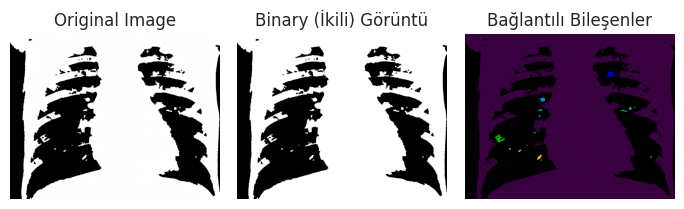

Image: NORMAL-4534031-0001.jpeg -> Bağlantılı Bileşen Sayısı = 46
---------------- NORMAL-4534031-0001.jpeg -----------------------


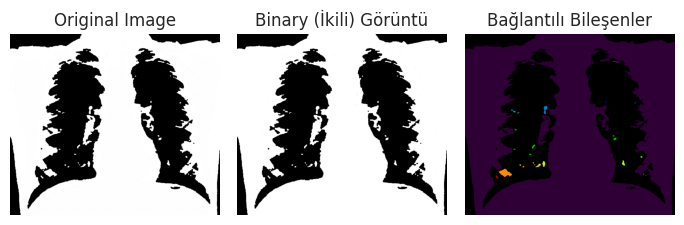

Image: NORMAL-8944072-0001.jpeg -> Bağlantılı Bileşen Sayısı = 21
---------------- NORMAL-8944072-0001.jpeg -----------------------


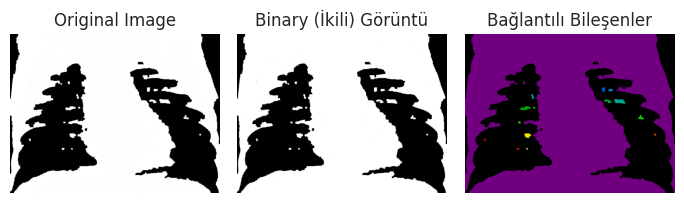

Image: NORMAL-520267-0001.jpeg -> Bağlantılı Bileşen Sayısı = 51
---------------- NORMAL-520267-0001.jpeg -----------------------


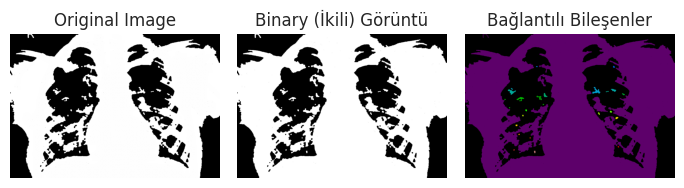

Image: NORMAL-6137647-0001.jpeg -> Bağlantılı Bileşen Sayısı = 54
---------------- NORMAL-6137647-0001.jpeg -----------------------


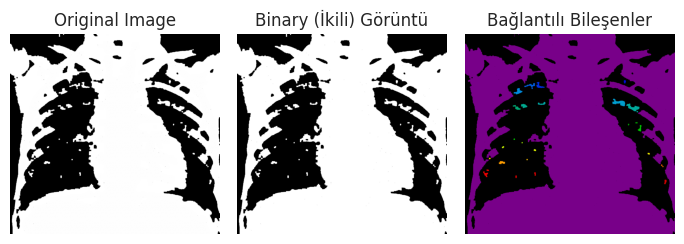

Image: NORMAL-2924895-0001.jpeg -> Bağlantılı Bileşen Sayısı = 26
---------------- NORMAL-2924895-0001.jpeg -----------------------


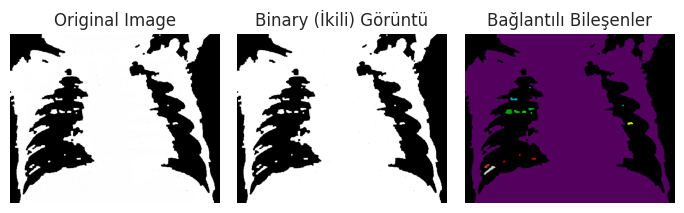

Image: NORMAL-1430636-0001.jpeg -> Bağlantılı Bileşen Sayısı = 74
---------------- NORMAL-1430636-0001.jpeg -----------------------


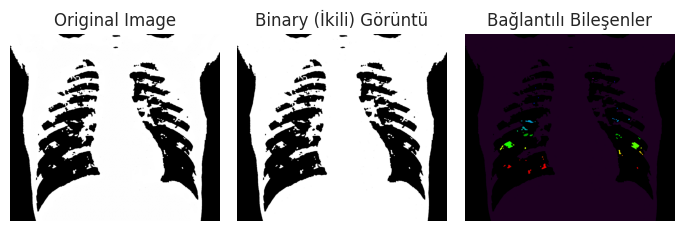

Image: NORMAL-8014191-0001.jpeg -> Bağlantılı Bileşen Sayısı = 38
---------------- NORMAL-8014191-0001.jpeg -----------------------


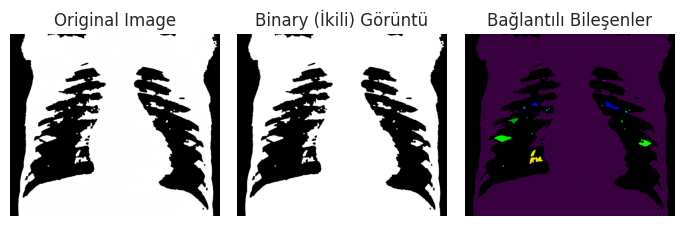

Image: NORMAL-5601980-0001.jpeg -> Bağlantılı Bileşen Sayısı = 27
---------------- NORMAL-5601980-0001.jpeg -----------------------


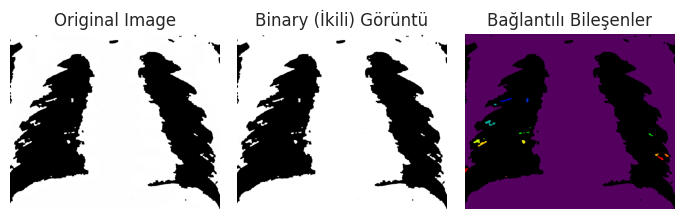

In [65]:
okunacak_klasor = "/content/Sayisal_Goruntu_Isleme/06_Morfolojik_Islenmis"
okunan_goruntuler = [f for f in os.listdir(okunacak_klasor) if os.path.isfile(os.path.join(okunacak_klasor, f))]
kayit_klasoru = "/content/Sayisal_Goruntu_Isleme/07_CCL_Sonuclar"
os.makedirs(kayit_klasoru, exist_ok=True)

silinecek_goruntuler = os.listdir(kayit_klasoru)
# Kayıt edilecek klasör önce temizlenir
for dosya in silinecek_goruntuler:
    if dosya.endswith(('.jpeg')):
        goruntu_yolu = os.path.join(kayit_klasoru, dosya)
        os.remove(goruntu_yolu)

for i, dosya_adi in enumerate(okunan_goruntuler):
    goruntu_yolu = os.path.join(okunacak_klasor, dosya_adi)
    goruntu = cv2.imread(goruntu_yolu, cv2.IMREAD_GRAYSCALE)

    # uint8 istiyor.
    goruntu = (goruntu * 255).astype(np.uint8)


    # Görüntüyü ikili (binary) formata dönüştürme
    _, bin_goruntu = cv2.threshold(goruntu, 127, 255, cv2.THRESH_BINARY)
    bin_goruntu = bin_goruntu.astype(np.uint8)

    # Bağlantılı bileşenleri bulma
    etiket_sayisi, etiket_gor = cv2.connectedComponents(bin_goruntu)

    cv2.imwrite(os.path.join(kayit_klasoru, f"{dosya_adi}"), etiket_gor)

    print(f"Image: {dosya_adi} -> Bağlantılı Bileşen Sayısı = {etiket_sayisi - 1}")  # Arka plan hariç


    plt.figure(figsize=(7, 7))
    print(f"---------------- {dosya_adi} -----------------------")

    plt.subplot(1, 3, 1)
    plt.imshow(goruntu, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(bin_goruntu, cmap='gray')
    plt.title('Binary (İkili) Görüntü')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(etiket_gor, cmap='nipy_spectral')  # Farklı bileşenler için renk
    plt.title('Bağlantılı Bileşenler')
    plt.axis('off')
    plt.tight_layout()
    plt.show()


**Orijinal Görüntü**

Bu görüntü, bir akciğer röntgeninin işlenmiş bir versiyonudur. Yüksek kontrastlı alanlar kullanılarak, akciğer içindeki hava dolu bölgeler ve potansiyel lezyonlar belirginleştirilmiştir.
Orijinal görüntü, göğüs boşluğunun iç yapısını göstermekte ve belirli bir eşikleme öncesinde analiz edilebilecek bilgi sağlamaktadır.

**Binary (İkili) Görüntü**

Burada görüntü, manuel eşikleme (127) yöntemiyle siyah-beyaz hale getirilmiştir.
Beyaz alanlar muhtemel akciğer dokusunu ve iç hava dolu alanları temsil ederken, siyah alanlar potansiyel sorunlu bölgeleri temsil ediyor olabilir.


**Bağlantılı Bileşenler**

Burada, ikili görüntüdeki farklı bağlantılı bileşenler renklendirilmiştir. Bu, farklı segmentlerin veya nesnelerin belirlenmesi için kullanılan bir görüntü işleme tekniğidir.
Bağlantılı bileşen analizi, akciğerlerde bulunan anormal yapıları tespit etmek için kullanılabilir.
Görüntüde farklı renklerle işaretlenen bölgeler, belirli anormallikleri veya hava dolu alanları temsil edebilir.
Özellikle tıbbi uygulamalarda, bu tür analizler anormal bölgelerin otomatik olarak tespit edilmesi ve doktorlara yardımcı olması açısından değerlidir.

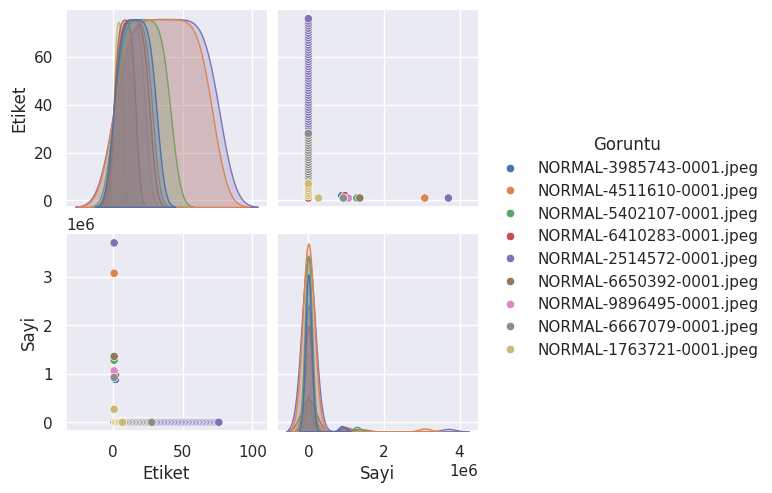

In [35]:
# prompt: Bir önceki kod hücresinde oluşturduğun connected components için (Seaborn) Pairplot fonksiyonunu incele. Pairplot ile ikili ilişkiyi incele(hue özelliğini aktive et. Renkli çizsin). Bu da seçici özniteliği bulmaya yardımcı olacak.

goruntu_verisi = []

okunacak_klasor = "/content/Sayisal_Goruntu_Isleme/06_Morfolojik_Islenmis"

for dosya_adi in os.listdir(okunacak_klasor):
  if dosya_adi.endswith(('.png', '.jpg', '.jpeg')):
    goruntu_yolu = os.path.join(okunacak_klasor, dosya_adi)
    goruntu = cv2.imread(goruntu_yolu, cv2.IMREAD_GRAYSCALE)

    if goruntu is not None:
        goruntu = (goruntu * 255).astype(np.uint8)

        _, ikili_goruntu = cv2.threshold(goruntu, 127, 255, cv2.THRESH_BINARY)

        etiket_sayisi, etiket_gor = cv2.connectedComponents(ikili_goruntu)

        tekil_etiket, tekil_sayi = np.unique(etiket_gor, return_counts=True)

        for etiket, sayi in zip(tekil_etiket, tekil_sayi):
          if etiket != 0:
              goruntu_verisi.append({'Goruntu': dosya_adi, 'Etiket': etiket, 'Sayi': sayi})


if goruntu_verisi:
    df = pd.DataFrame(goruntu_verisi)
    sns.pairplot(df, hue='Goruntu', diag_kind='kde')
    plt.show()
else:
  print("Goruntu verisi mevcut degil.")


##5.5. Seçtiğiniz labela sahip filtrelenmiş görüntülere uygun morfolojik işlemleri uygulayın.

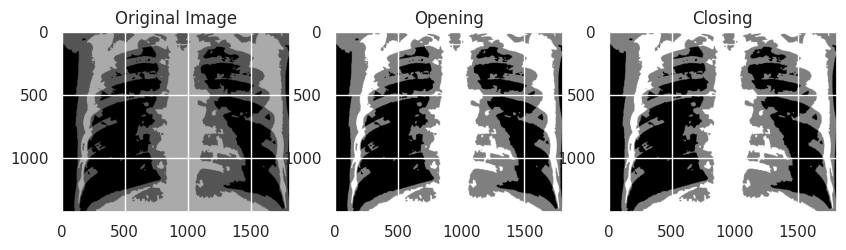

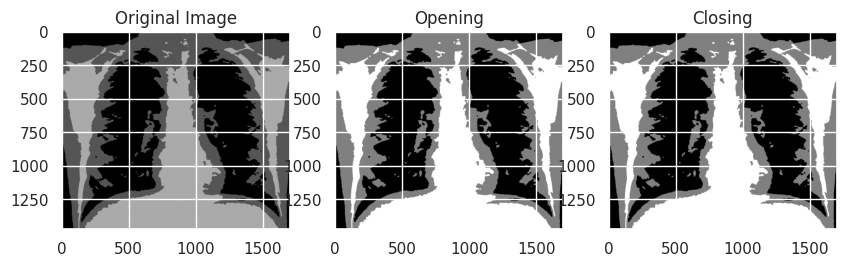

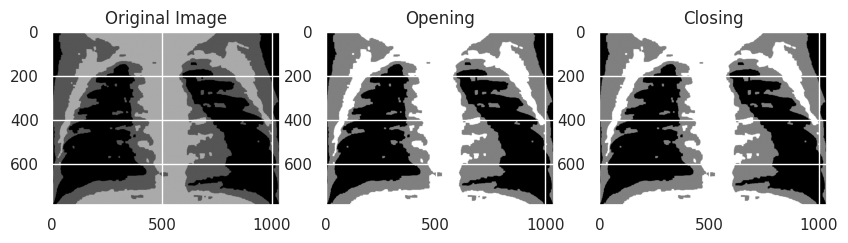

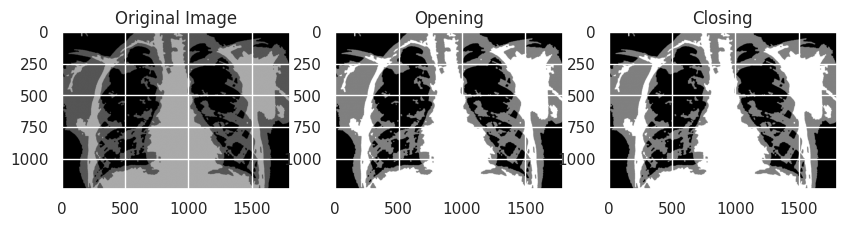

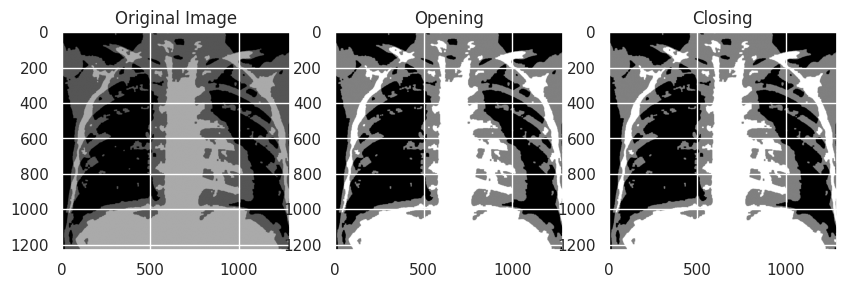

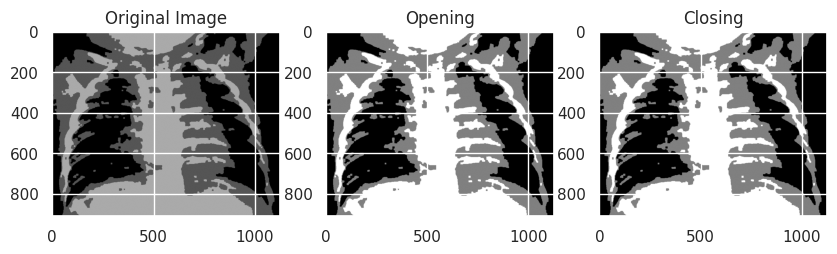

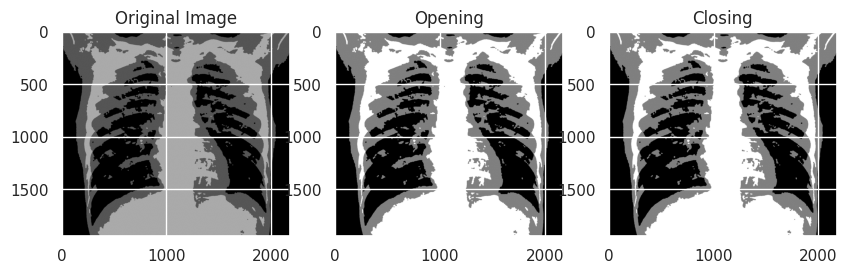

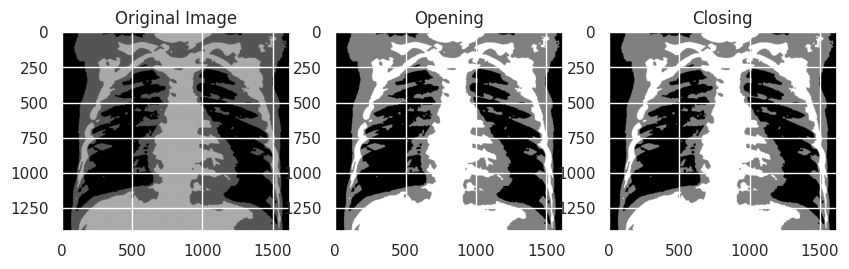

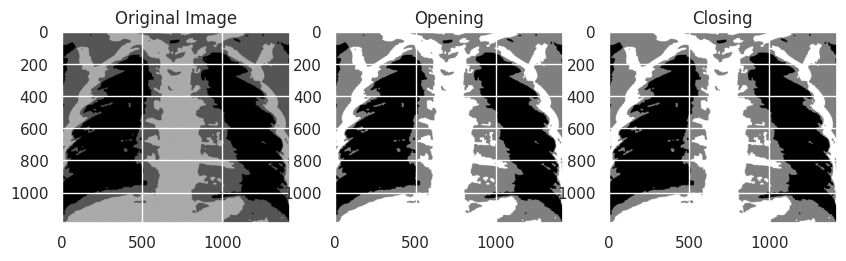

In [66]:
okunacak_klasor = "/content/Sayisal_Goruntu_Isleme/06_Morfolojik_Islenmis"
okunan_goruntuler = [f for f in os.listdir(okunacak_klasor) if os.path.isfile(os.path.join(okunacak_klasor, f))]
kayit_klasoru = "/content/Sayisal_Goruntu_Isleme/08_Morfolojik_Islenmis"
os.makedirs(kayit_klasoru, exist_ok=True)

kernel_boyutu = 7
kernel = np.ones((kernel_boyutu, kernel_boyutu), np.uint8)

for dosya_adi in okunan_goruntuler:
    goruntu_yolu = os.path.join(okunacak_klasor, dosya_adi)
    goruntu = cv2.imread(goruntu_yolu, cv2.IMREAD_GRAYSCALE)

    if goruntu is not None:

        opening_img = morphology.opening(goruntu, kernel)
        closing_img = morphology.closing(opening_img, kernel)

        cv2.imwrite(os.path.join(kayit_klasoru, dosya_adi), closing_img)

        fig, eksenler = plt.subplots(1, 3, figsize=(10, 5))
        eksenler[0].imshow(goruntu, cmap='gray')
        eksenler[0].set_title('Original Image')
        eksenler[1].imshow(opening_img, cmap='gray')
        eksenler[1].set_title('Opening')
        eksenler[2].imshow(closing_img, cmap='gray')
        eksenler[2].set_title('Closing')
        plt.show()
    else:
        print(f"{goruntu_yolu} bos ve okunamadi.")


#6. Sonuçlar

NORMAL-3985743-0001.jpeg isimli goruntu iki klasor icinde farklı boyutlarda.
NORMAL-5402107-0001.jpeg isimli goruntu iki klasor icinde farklı boyutlarda.
NORMAL-9896495-0001.jpeg isimli goruntu iki klasor icinde farklı boyutlarda.
NORMAL-6667079-0001.jpeg isimli goruntu iki klasor icinde farklı boyutlarda.
NORMAL-1763721-0001.jpeg isimli goruntu iki klasor icinde farklı boyutlarda.


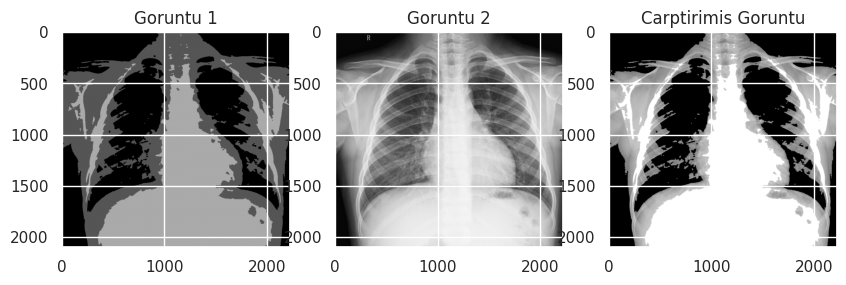

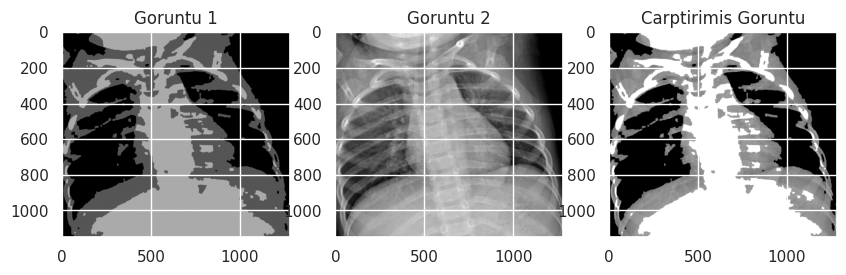

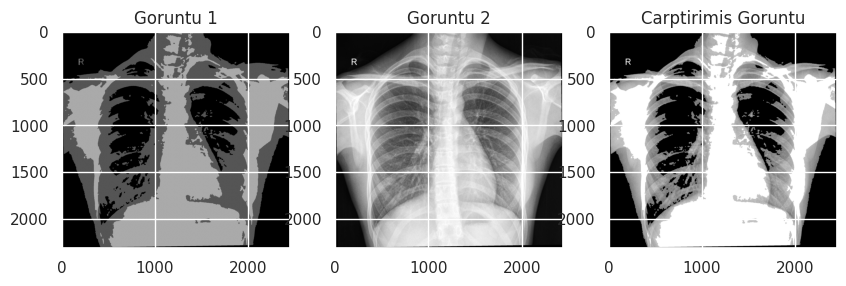

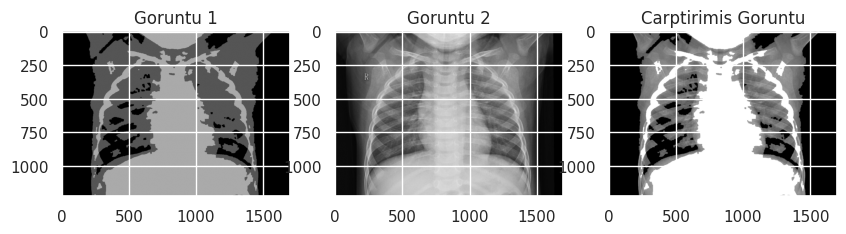

In [37]:
# prompt: "/content/Sayisal_Goruntu_Isleme/SON_Morfolojik_Islenmis" klasörü altındaki görüntüler ile "/content/Sayisal_Goruntu_Isleme/Kirpilmis" klasörü altında aynı isimle yer alan görüntüleri carp. Sonuçları göster.

dizin_1 = "/content/Sayisal_Goruntu_Isleme/08_Morfolojik_Islenmis"
dizin_2 = "/content/Sayisal_Goruntu_Isleme/01_Kirpilmis"

sonuclar = []

# Iterate through the images in the first folder
for dosya_adi in os.listdir(dizin_1):
    if dosya_adi.endswith(('.png', '.jpg', '.jpeg')):
        # Construct the full paths for both images
        gor_1_yolu = os.path.join(dizin_1, dosya_adi)
        gor_2_yolu = os.path.join(dizin_2, dosya_adi)

        # İlgili görüntünün ikinci klasörde mevcut olup olmadığı kontrol edilir
        if os.path.exists(gor_2_yolu):
            goruntu_1 = cv2.imread(gor_1_yolu, cv2.IMREAD_GRAYSCALE)
            goruntu_2 = cv2.imread(gor_2_yolu, cv2.IMREAD_GRAYSCALE)

            if goruntu_1 is not None and goruntu_2 is not None:
                # Her iki görüntü de aynı boyutlara sahip olmalıdır
                if goruntu_1.shape == goruntu_2.shape:

                    carptirilmis_goruntu = cv2.multiply(goruntu_1, goruntu_2)

                    sonuclar.append((dosya_adi, carptirilmis_goruntu))
                else:
                    print(f"{dosya_adi} isimli goruntu iki klasor icinde farklı boyutlarda.")
            else:
                print(f"{dosya_adi} isimli görüntü okunamadı.")
        else:
            print(f"{dosya_adi} isimli görüntü ikinci dizinde bulunamadı.")

# Display the sonuclar
for dosya_adi, carptirilmis_goruntu in sonuclar:
  plt.figure(figsize=(10, 5))
  plt.subplot(1, 3, 1)
  plt.imshow(cv2.imread(os.path.join(dizin_1, dosya_adi), cv2.IMREAD_GRAYSCALE), cmap='gray')
  plt.title('Goruntu 1')

  plt.subplot(1, 3, 2)
  plt.imshow(cv2.imread(os.path.join(dizin_2, dosya_adi), cv2.IMREAD_GRAYSCALE), cmap='gray')
  plt.title('Goruntu 2')

  plt.subplot(1, 3, 3)
  plt.imshow(carptirilmis_goruntu, cmap='gray')
  plt.title('Carptirimis Goruntu')
  plt.show()


**Bu işlem, akciğer bölgesini daha belirgin hale getirerek, teşhis amaçlı daha detaylı inceleme yapılmasını sağlamaktadır. Bu sayede, modelin doğru bölge üzerinde çalışmasını sağlayarak, daha başarılı sonuçlar elde etmeye yardımcı olacaktır. İleriki aşamalarda bu işlenmiş veriler üzerinden akciğer hastalıklarını sınıflandırma veya anormal bölgeleri tespit etme çalışmalarına hazırlık yapılmıştır...**